### Q1

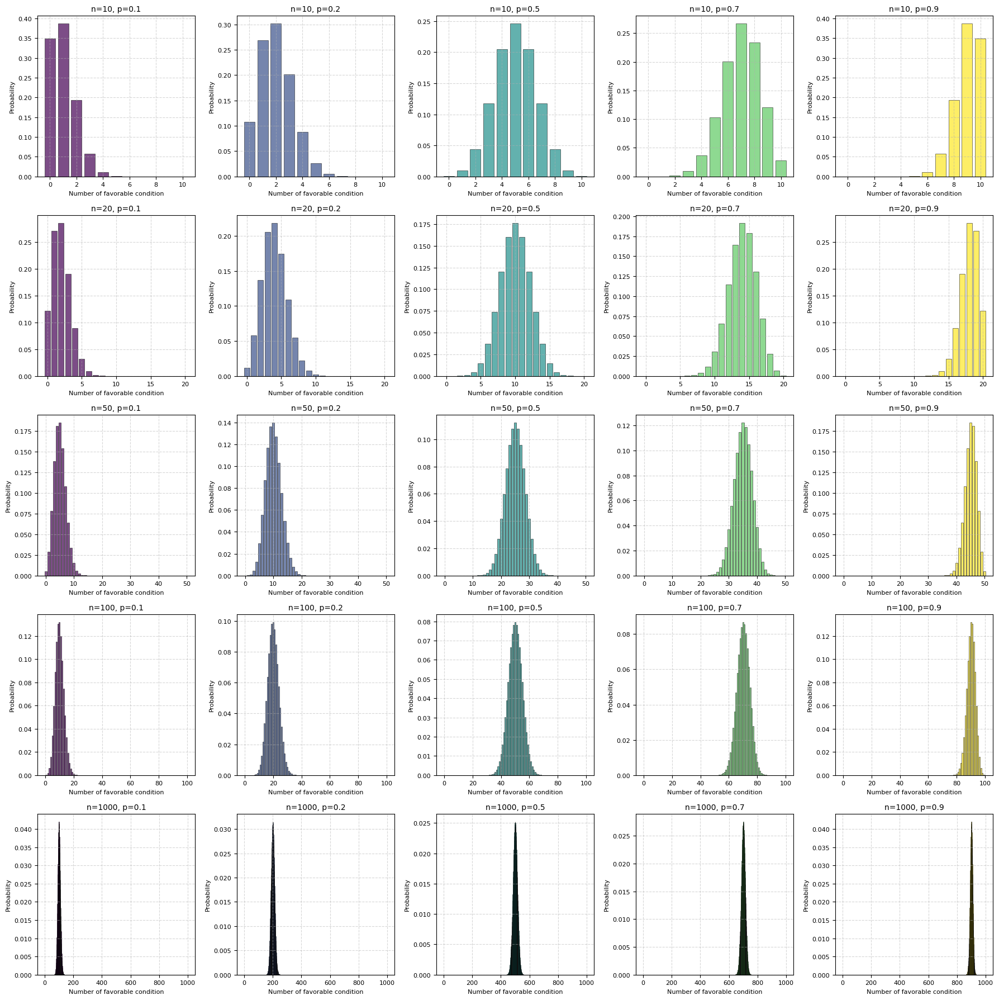

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as st

probs = [0.1, 0.2, 0.5, 0.7, 0.9]
nums = [10, 20, 50, 100, 1000]

# Define a colormap
colors = plt.cm.viridis(np.linspace(0, 1, len(probs)))

fig, axes = plt.subplots(5, 5, figsize=(18, 18))

for i, n in enumerate(nums):
    for j, p in enumerate(probs):
        x = np.arange(0, n+1)
        pmf_values = st.binom.pmf(x, n, p)
        ax = axes[i, j]
        ax.bar(x, pmf_values, color=colors[j], alpha=0.7, edgecolor='black', linewidth=0.5)
        ax.set_title(f'n={n}, p={p}', fontsize=10)
        ax.set_xlabel('Number of favorable condition', fontsize=8)
        ax.set_ylabel('Probability', fontsize=8)
        ax.grid(True, linestyle='--', alpha=0.5)
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontsize(8)

plt.tight_layout()
plt.show()

##Q2

In [ ]:
import random

# Define simulation parameters
num_simulations = 10000
num_tickets = 80
target_station = 300

# Initialize counters for the number of successful outcomes and for tracking min/max sums
success_count = 0
min_sum = float('inf')  # Set to infinity initially for minimum sum
max_sum = 0  # Set to zero initially for maximum sum

# Run the simulation 10,000 times
for _ in range(num_simulations):
    # Sum the results of 80 rolls of a 10-sided die
    station_sum = sum(random.randint(1, 10) for _ in range(num_tickets))
    # Track the min and max sums
    min_sum = min(min_sum, station_sum)
    max_sum = max(max_sum, station_sum)
    # If the sum is greater than 300, it's a successful outcome
    if station_sum > target_station:
        success_count += 1

# Calculate the probability
probability = success_count / num_simulations

# Print the results
print(f"Minimum sum in simulations: {min_sum}")
print(f"Maximum sum in simulations: {max_sum}")
print(f"Number of times sum was greater than 300: {success_count}")
print(f"Probability of sum being greater than 300: {probability}")

Minimum sum in simulations: 344
Maximum sum in simulations: 528
Number of times sum was greater than 300: 10000
Probability of sum being greater than 300: 1.0


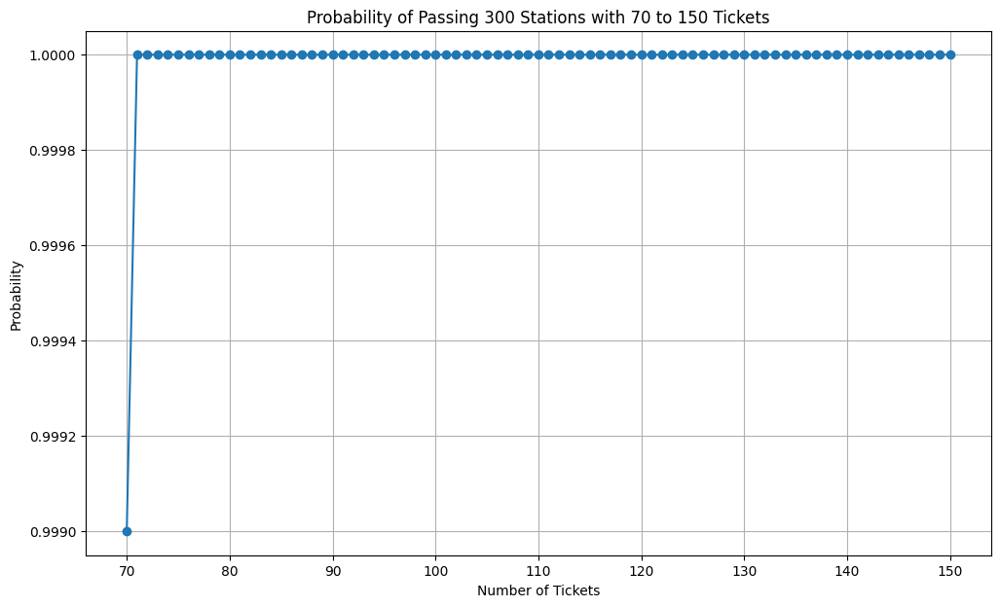

In [ ]:
# Define simulation parameters
num_simulations_reduced = 1000
ticket_range = range(70, 151)  # From 70 to 150 tickets
target_station = 300

# Initialize a dictionary to store probabilities for each number of tickets
probabilities_optimized = {}

# Run the simulation for each number of tickets in the range
for num_tickets in ticket_range:
    success_count = sum(
        sum(random.randint(1, 10) for _ in range(num_tickets)) > target_station
        for _ in range(num_simulations_reduced)
    )
    probabilities_optimized[num_tickets] = success_count / num_simulations_reduced

# Plotting
plt.figure(figsize=(12, 7))
plt.plot(list(probabilities_optimized.keys()), list(probabilities_optimized.values()), marker='o', linestyle='-')
plt.title('Probability of Passing 300 Stations with 70 to 150 Tickets')
plt.xlabel('Number of Tickets')
plt.ylabel('Probability')
plt.grid(True)
plt.show()

##Q3

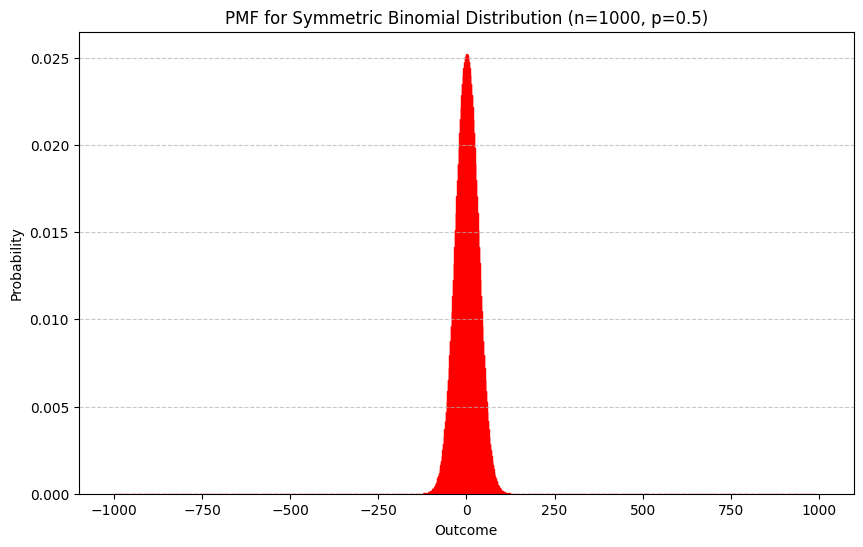

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.special as spc

# Renamed for clarity
outcomes = np.arange(-1000, 1000)
total_trials = 1000

# Original PMF calculation retained
pmf_values = [spc.comb(total_trials, (total_trials + outcome) // 2) * (0.5 ** total_trials) for outcome in outcomes]

# Improved plot appearance
plt.figure(figsize=(10, 6))
plt.bar(outcomes, pmf_values, color='skyblue', edgecolor='red', align='center')
plt.xlabel('Outcome')
plt.ylabel('Probability')
plt.title('PMF for Symmetric Binomial Distribution (n=1000, p=0.5)')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

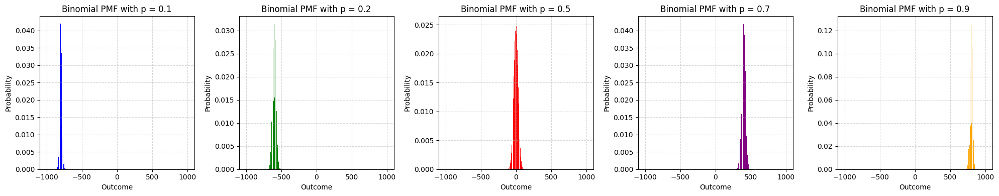

In [ ]:
probs = [0.1, 0.2, 0.5, 0.7, 0.9]
outcome_range = np.arange(-1000, 1000)
total_trials = 1000
fig, axes = plt.subplots(1, 5, figsize=(20, 4))

colors = ['blue', 'green', 'red', 'purple', 'orange']

for i in range(5):
    pmf_values = [spc.comb(total_trials, (total_trials+z)//2) * probs[i]**((total_trials+z)/2) * (1-probs[i])**((total_trials-z)/2) for z in outcome_range]
    ax = axes[i]
    ax.bar(outcome_range, pmf_values, color=colors[i], align='center')
    ax.set_title(f'Binomial PMF with p = {probs[i]}')
    ax.set_xlabel('Outcome')
    ax.set_ylabel('Probability')
    ax.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [ ]:
import numpy as np

def calculate_mean_position(total_runs, probability, steps=10000):
    # Vectorized random choice for efficiency
    moves = np.random.choice([-1, 1], size=(total_runs, steps), p=[1-probability, probability])
    final_positions = np.sum(moves, axis=1)
    return np.mean(final_positions)

# List of probabilities to test
probs = [0.1, 0.2, 0.5, 0.7, 0.9]
total_simulations = 10000

for p in probs:
    mean_position = calculate_mean_position(total_simulations, p)
    print(f'Mean position after {total_simulations} steps with p = {p} is {mean_position:.2f}')

Mean position after 10000 steps with p = 0.1 is -7999.68
Mean position after 10000 steps with p = 0.2 is -5999.03
Mean position after 10000 steps with p = 0.5 is 0.07
Mean position after 10000 steps with p = 0.7 is 3999.89
Mean position after 10000 steps with p = 0.9 is 7999.16


In [ ]:
N = 100000
for p in probs:
    print(f'Mean position after 10000 step with p = {p} is {calculate_mean_position(N,p)}')

## Q4

In [ ]:
import numpy as np

# Simulate Jack's movement 100,000 times
num_simulations = 100000
to_zoo = 0  # Counter for the number of times Jack goes to the zoo (station 2)
to_park = 0  # Counter for the number of times Jack goes to the amusement park (station -1)

for _ in range(num_simulations):
    position = 0  # Start at station 0
    # Simulate Jack's movement until he reaches the zoo or the amusement park
    while position != 2 and position != -1:
        move = np.random.choice([-1, 1], p=[0.5, 0.5])  # Move forward or backward with equal probability
        position += move

    # Increment the appropriate counter
    if position == 2:
        to_zoo += 1
    elif position == -1:
        to_park += 1

# Output the results
print(f"Jack goes to the zoo {to_zoo} times.")
print(f"Jack goes to the amusement park {to_park} times.")

Jack goes to the zoo 33378 times.
Jack goes to the amusement park 66622 times.


## Q5

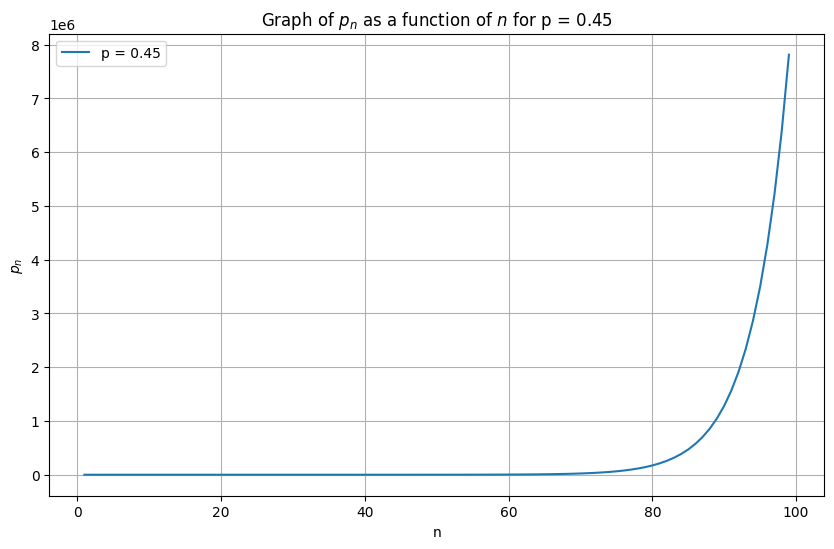

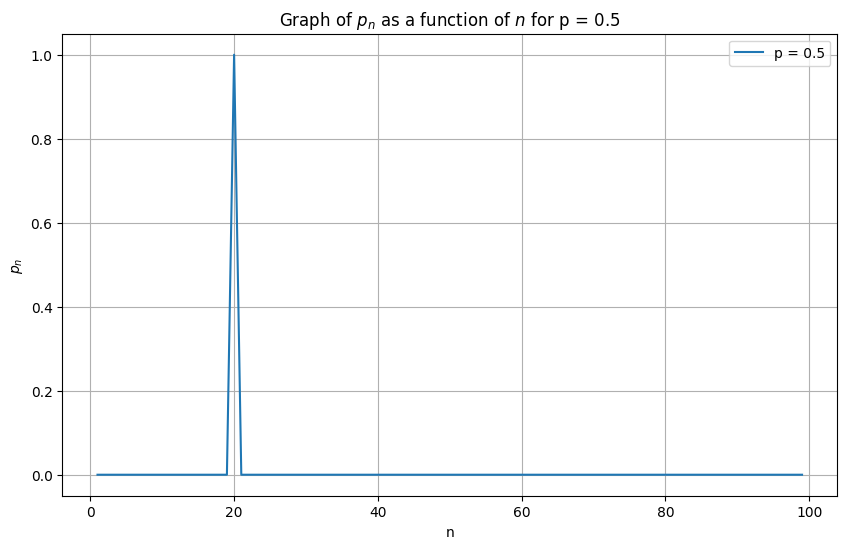

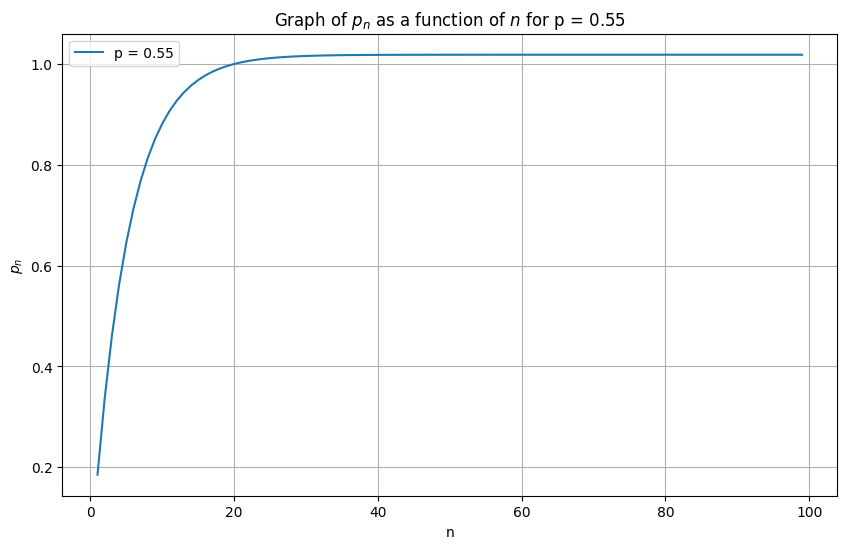

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the function to calculate p_n based on the provided formula
def p_n(n, p, l):
    # Handle the case when p is 0.5 to avoid division by zero
    if p == 0.5:
        return 1.0 if n == l else 0.0
    else:
        return (((1 - p) / p) ** (n) - 1) / (((1 - p) / p) ** (l) - 1)

# Parameters
l = 20
p_values = [0.45, 0.5, 0.55]
n_values = np.arange(1, 100)  # Range of n

# Plotting p_n as a function of n for different values of p
for p in p_values:
    plt.figure(figsize=(10, 6))
    p_n_values = [p_n(n, p, l) for n in n_values]
    plt.plot(n_values, p_n_values, label=f'p = {p}')
    plt.title(f'Graph of $p_n$ as a function of $n$ for p = {p}')
    plt.xlabel('n')
    plt.ylabel('$p_n$')
    plt.legend()
    plt.grid(True)
    plt.show()

## Q6

In [ ]:
import numpy as np

def simulate_random_walk(target_position, steps, forward_probability):
    current_position = 0
    passing_count = 0
    for _ in range(steps):
        move_direction = np.random.choice([-1, 1], p=[1 - forward_probability, forward_probability])
        current_position += move_direction
        if current_position == target_position:
            passing_count += 1
    return passing_count

def average_passing_count(simulations, target_position, steps, forward_probability):
    total_passing_count = 0
    for _ in range(simulations):
        total_passing_count += simulate_random_walk(target_position, steps, forward_probability)
    return total_passing_count / simulations

# Parameters
target_position = 2
steps = 10000
forward_probability = 0.3
simulations = 1000

# Calculate the average number of times passing the target position
mean_passing_count = average_passing_count(simulations, target_position, steps, forward_probability)
print(f'Mean number of times passing from +{target_position} after {steps} steps is {mean_passing_count}')

Mean number of times passing from +2 after 10000 steps is 0.457


## Q7

In [ ]:
 import numpy as np

# Set parameters for the simulation
p = 0.55  # Probability of moving forward
k = 40  # Target station
num_simulations = 10000  # Number of simulations
total_steps = 0  # Total steps to reach station k

# Run the simulations
for _ in range(num_simulations):
    position = 0  # Start at station 0
    steps = 0  # Steps counter

    # Simulate Jack's movement until he reaches station k
    while position != k:
        move = 1 if np.random.rand() < p else -1  # Determine move direction
        position += move
        steps += 1

    total_steps += steps

# Calculate the average number of steps to reach station k
average_steps_to_k = total_steps / num_simulations

# Print the result
print(f"Average steps to reach station {k}: {average_steps_to_k}")

Average steps to reach station 40: 404.7184


## Q8

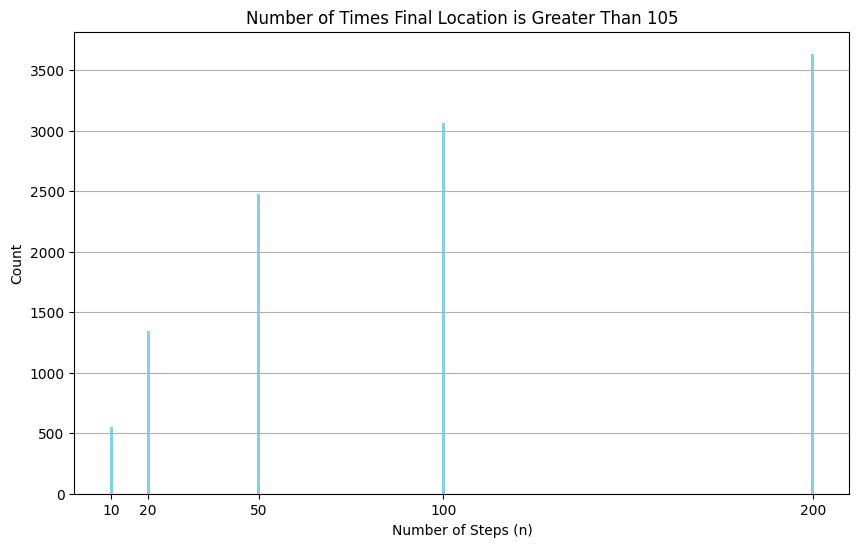

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Simulation parameters
p = 0.55  # Probability of moving forward
n_values = [10, 20, 50, 100, 200]  # Different numbers of steps to simulate
num_simulations = 10000  # Number of simulations to run for each step count
initial_position = 100  # Initial position Z0
threshold = 105  # Threshold for final position

# Dictionary to store results
final_position_counts = {}

# Perform simulations for each n value
for n in n_values:
    count_above_threshold = 0
    # Run simulations
    for _ in range(num_simulations):
        # Generate n random steps with mean=0 and variance=1
        steps = np.random.normal(0, 1, n)
        final_position = initial_position + np.sum(steps)
        # Check if the final position is above the threshold
        if final_position > threshold:
            count_above_threshold += 1
    final_position_counts[n] = count_above_threshold

# Plotting the results
plt.figure(figsize=(10, 6))
plt.bar(final_position_counts.keys(), final_position_counts.values(), color='skyblue')
plt.title('Number of Times Final Location is Greater Than 105')
plt.xlabel('Number of Steps (n)')
plt.ylabel('Count')
plt.xticks(n_values)
plt.grid(axis='y')
plt.show()

## Q 9

In [36]:
import numpy as np

# Initialize a counter for the number of times s goes below 0
n = 0

# Perform 1000 simulations
for i in range(1000):
    s = 0

    # Simulate 100 steps
    for j in range(100):
        # Generate a random value from a normal distribution with mean 5 and standard deviation 1
        step = np.random.normal(5, 1, 1)
        s += step

        # Check if s goes below 0
        if s <= 0:
            n += 1
            break

# Calculate the probability of s not going below 0
probability_not_below_zero = (1000 - n) / 1000

# Print the result
print(f"Probability of not going below 0: {probability_not_below_zero:.4f}")

Probability of not going below 0: 1.0000


In [37]:
import numpy as np

# Initialize a counter for the number of times s goes below 0
n = 0

# Perform 1000 simulations
for i in range(1000):
    s = 0

    # Simulate 100 steps
    for j in range(100):
        # Generate a random value from a normal distribution with mean 5 and standard deviation 1
        step = np.random.normal(2, np.sqrt(5), 1)
        s += step

        # Check if s goes below 0
        if s <= 0:
            n += 1
            break

# Calculate the probability of s not going below 0
probability_not_below_zero = (1000 - n) / 1000

# Print the result
print(f"Probability of not going below 0: {probability_not_below_zero:.4f}")

Probability of not going below 0: 0.7520


In [38]:
import numpy as np

# Define the number of simulations
num_simulations = 1000

# Define the number of steps in each simulation
num_steps = 100

# Initialize a list to store the results of each simulation
results = []

# Perform the simulations
for _ in range(num_simulations):
    # Initialize variables
    z0 = 0
    unique_positions = set()

    for _ in range(num_steps):
        # Generate a random value from a normal distribution with mean 5 and standard deviation 1
        a = int(np.random.normal(5, 1, 1).sum())
        z0 += a
        unique_positions.add(z0)

    # Store the number of unique positions in this simulation
    results.append(len(unique_positions))

# Calculate the average number of unique positions across all simulations
average_unique_positions = sum(results) / (num_steps * num_simulations)

# Print the result
print(f"Average number of unique positions: {average_unique_positions:.4f}")

Average number of unique positions: 0.9999


### The Average number of unique positions is equal to the Probability of not going below 0 as expected

In [39]:
import numpy as np

# Define the number of simulations
num_simulations = 1000

# Define the number of steps in each simulation
num_steps = 100

# Initialize a list to store the results of each simulation
results = []

# Perform the simulations
for _ in range(num_simulations):
    # Initialize variables
    z0 = 0
    unique_positions = set()

    for _ in range(num_steps):
        # Generate a random value from a normal distribution with mean 5 and standard deviation 1
        a = int(np.random.normal(2, np.sqrt(5), 1).sum())
        z0 += a
        unique_positions.add(z0)

    # Store the number of unique positions in this simulation
    results.append(len(unique_positions))

# Calculate the average number of unique positions across all simulations
average_unique_positions = sum(results) / (num_steps * num_simulations)

# Print the result
print(f"Average number of unique positions: {average_unique_positions:.4f}")

Average number of unique positions: 0.7011


### Again we can see the relation between the two variables but this time with another Normal distribution.

## Q10

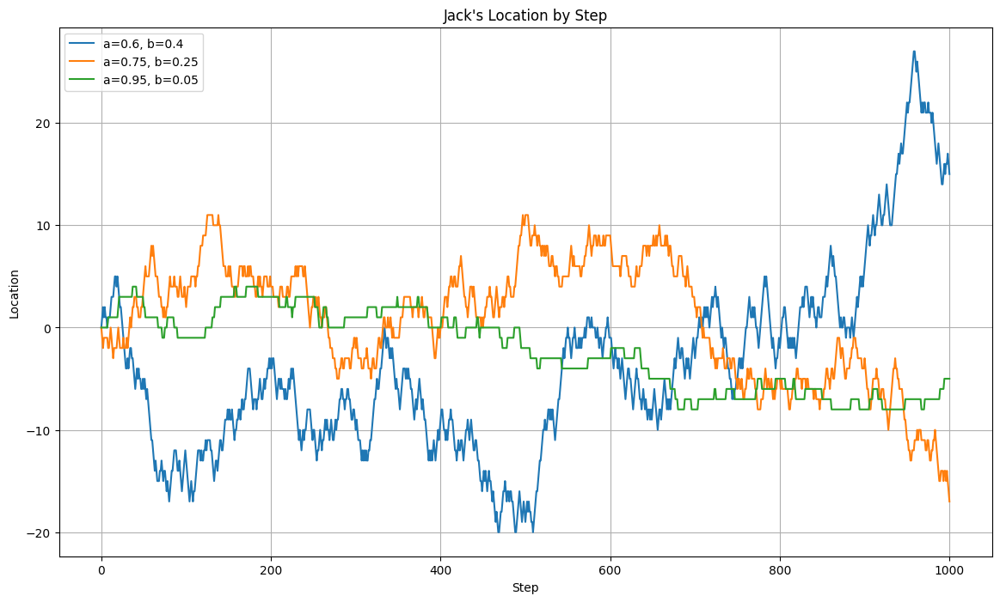

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the number of steps
n = 1000

# Threshold values for a and b
thresholds = [(0.6, 0.4), (0.75, 0.25), (0.95, 0.05)]

# Initialize a list to store the position history for each set of thresholds
positions = []

# Loop through each set of threshold values
for a, b in thresholds:
    # Start position at 0
    position = 0
    position_history = [position]  # Keep track of position over time

    # Generate random steps from a uniform distribution
    steps = np.random.uniform(0, 1, n)

    # Determine movement based on the thresholds
    for step in steps:
        if step >= a:
            position += 1  # Move forward
        elif step <= b:
            position -= 1  # Move backward
        # If step is between a and b, stay in the same position (no action needed)

        position_history.append(position)

    # Store the position history
    positions.append(position_history)

# Plot the results
plt.figure(figsize=(14, 8))
for i, (a, b) in enumerate(thresholds):
    plt.plot(positions[i], label=f'a={a}, b={b}')

plt.title("Jack's Location by Step")
plt.xlabel('Step')
plt.ylabel('Location')
plt.legend()
plt.grid(True)
plt.show()

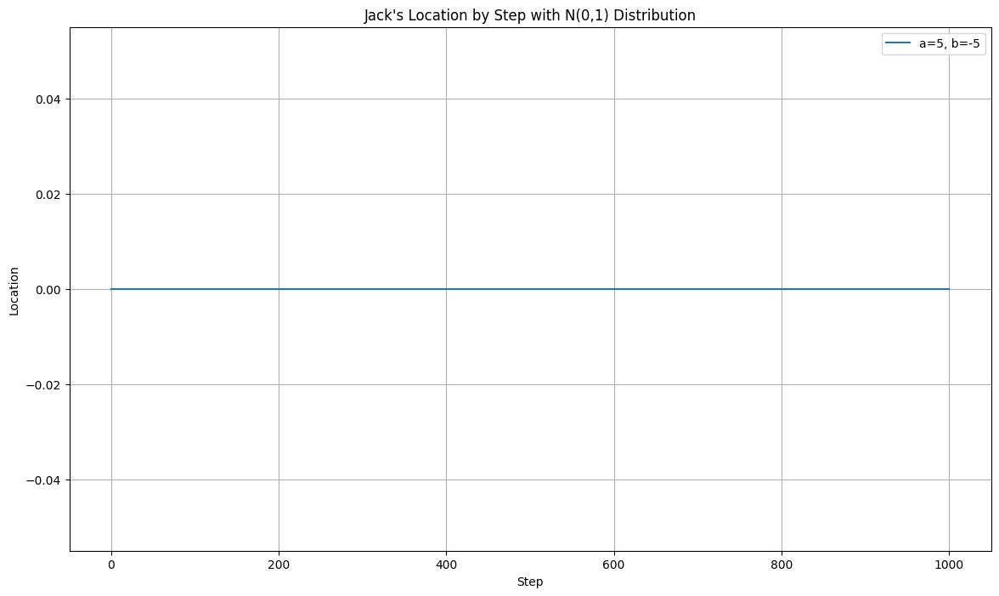

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the number of steps
n = 1000

# Threshold values for a and b
a, b = 5, -5

# Start position at 0
position = 0
position_history = [position]  # Keep track of position over time

# Generate random steps from a normal distribution
steps = np.random.normal(0, 1, n)

# Determine movement based on the thresholds
for step in steps:
    if step >= a:
        position += 1  # Move forward
    elif step <= b:
        position -= 1  # Move backward
    # If step is between a and b, stay in the same position (no action needed)

    position_history.append(position)

# Plot the results
plt.figure(figsize=(14, 8))
plt.plot(position_history, label=f'a={a}, b={b}')

plt.title("Jack's Location by Step with N(0,1) Distribution")
plt.xlabel('Step')
plt.ylabel('Location')
plt.legend()
plt.grid(True)
plt.show()

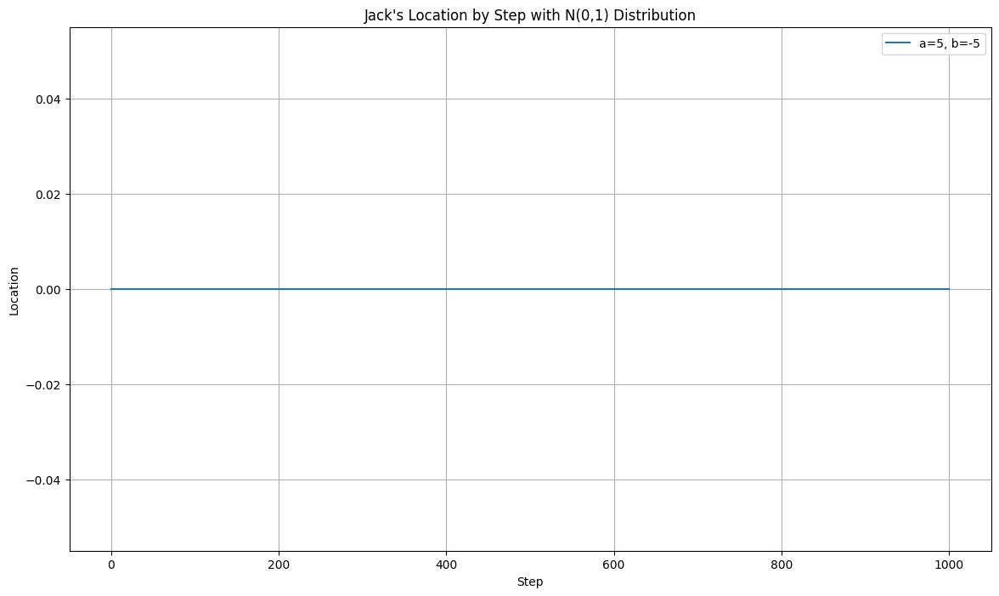

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the number of steps
n = 1000

# Threshold values for a and b
a, b = 5, -5

# Start position at 0
position = 0
position_history = [position]  # Keep track of position over time

# Generate random steps from a normal distribution
steps = np.random.normal(0, 1, n)

# Determine movement based on the thresholds
for step in steps:
    if step >= a:
        position += 1  # Move forward
    elif step <= b:
        position -= 1  # Move backward
    # If step is between a and b, stay in the same position (no action needed)

    position_history.append(position)

# Plot the results
plt.figure(figsize=(14, 8))
plt.plot(position_history, label=f'a={a}, b={b}')

plt.title("Jack's Location by Step with N(0,1) Distribution")
plt.xlabel('Step')
plt.ylabel('Location')
plt.legend()
plt.grid(True)
plt.show()

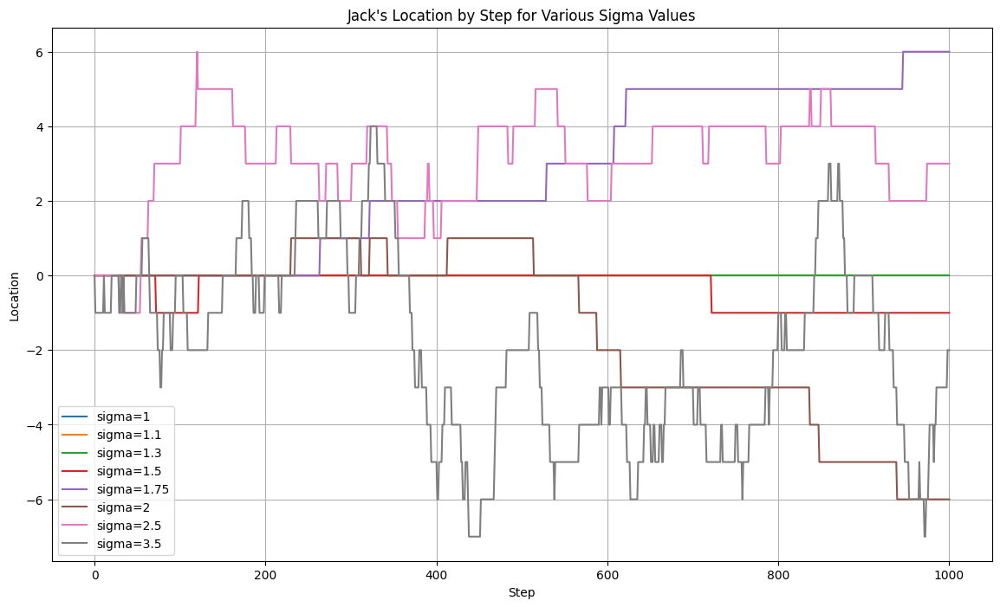

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the number of steps
n = 1000

# Threshold values for a and b
a, b = 5, -5

# Define the sigma values to be considered
sigma_values = [1, 1.1, 1.3, 1.5, 1.75, 2, 2.5, 3.5]

# Initialize a list to store the position history for each sigma
position_histories = []

# Loop through each sigma value
for sigma in sigma_values:
    # Reset Jack's starting position
    position = 0
    position_history = [position]  # Keep track of position over time

    # Generate random steps from a normal distribution with mean=0 and current sigma
    steps = np.random.normal(0, sigma, n)

    # Determine movement based on the thresholds
    for step in steps:
        if step >= a:
            position += 1  # Move forward
        elif step <= b:
            position -= 1  # Move backward
        # If step is between a and b, Jack stays in the same position (no action needed)

        position_history.append(position)

    # Store the position history for the current sigma
    position_histories.append(position_history)

# Plotting the results for each sigma
plt.figure(figsize=(14, 8))
for i, sigma in enumerate(sigma_values):
    plt.plot(position_histories[i], label=f'sigma={sigma}')

plt.title("Jack's Location by Step for Various Sigma Values")
plt.xlabel('Step')
plt.ylabel('Location')
plt.legend()
plt.grid(True)
plt.show()

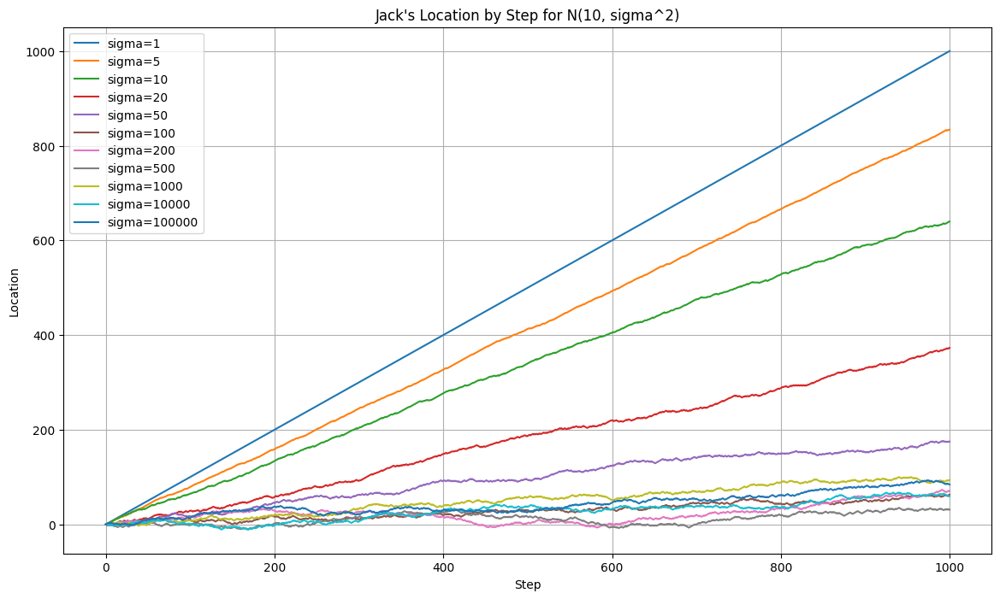

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the number of steps
n = 1000

# Threshold values for a and b
a, b = 5, -5

# Define the sigma values to be considered
sigma_values = [1, 5, 10, 20, 50, 100, 200, 500, 1000, 10000, 100000]

# Initialize a list to store the position history for each sigma
position_histories = []

# Loop through each sigma value
for sigma in sigma_values:
    # Reset Jack's starting position
    position = 0
    position_history = [position]  # Keep track of position over time

    # Generate random steps from a normal distribution with mean=10 and current sigma
    steps = np.random.normal(10, sigma, n)

    # Determine movement based on the thresholds
    for step in steps:
        if step >= a:
            position += 1  # Move forward
        elif step <= b:
            position -= 1  # Move backward
        # If step is between a and b, Jack stays in the same position (no action needed)

        position_history.append(position)

    # Store the position history for the current sigma
    position_histories.append(position_history)

# Plotting the results for each sigma
plt.figure(figsize=(14, 8))
for i, sigma in enumerate(sigma_values):
    plt.plot(position_histories[i], label=f'sigma={sigma}')

plt.title("Jack's Location by Step for N(10, sigma^2)")
plt.xlabel('Step')
plt.ylabel('Location')
plt.legend()
plt.grid(True)
plt.show()

## Q11

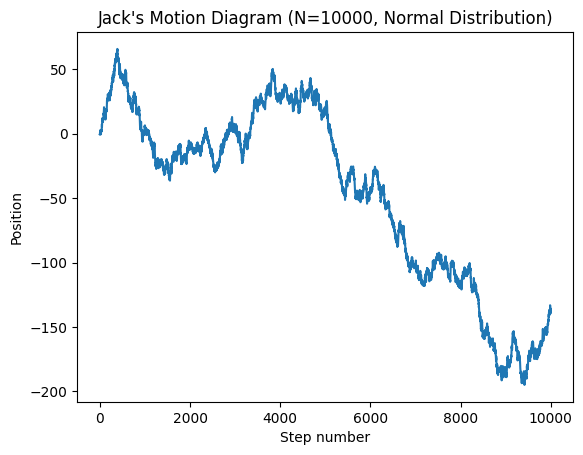

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define number of steps
N = 10000

# Simulate random steps from normal distribution
steps = np.random.normal(0, 1, N)

# Accumulate steps to get Jack's position
position = np.cumsum(steps)

# Plot the motion diagram
plt.plot(range(N), position)
plt.xlabel("Step number")
plt.ylabel("Position")
plt.title("Jack's Motion Diagram (N=10000, Normal Distribution)")
plt.show()

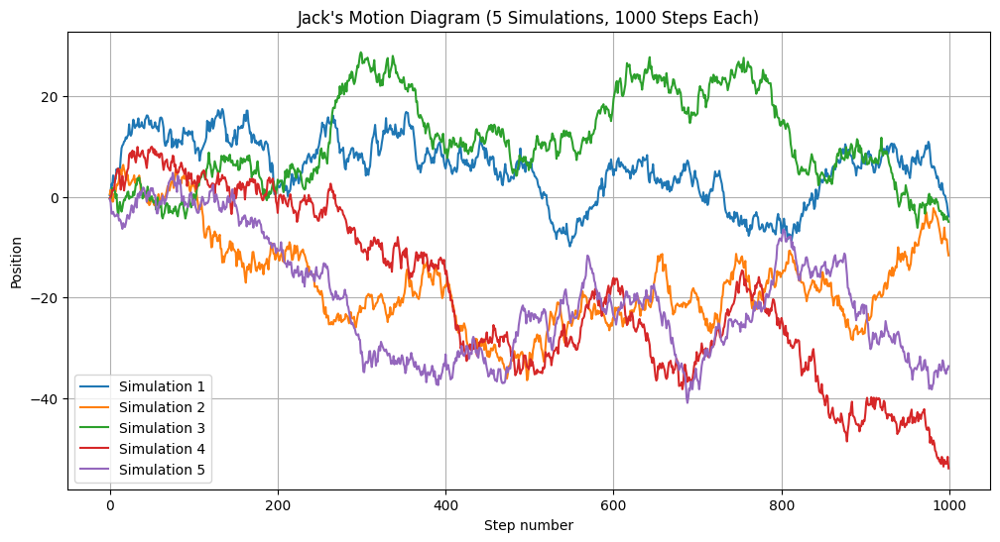

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the number of simulations and steps per simulation
num_simulations = 5
steps_per_simulation = 1000

# Initialize a list to store the position histories
position_histories = []

# Perform the simulations
for _ in range(num_simulations):
    # Simulate random steps from a normal distribution
    steps = np.random.normal(0, 1, steps_per_simulation)
    position = np.cumsum(steps)
    position_histories.append(position)

# Create a figure and plot the results for each simulation
plt.figure(figsize=(12, 6))
for i, position_history in enumerate(position_histories):
    plt.plot(range(steps_per_simulation), position_history, label=f'Simulation {i+1}')

plt.xlabel("Step number")
plt.ylabel("Position")
plt.title("Jack's Motion Diagram (5 Simulations, 1000 Steps Each)")
plt.legend()
plt.grid(True)
plt.show()

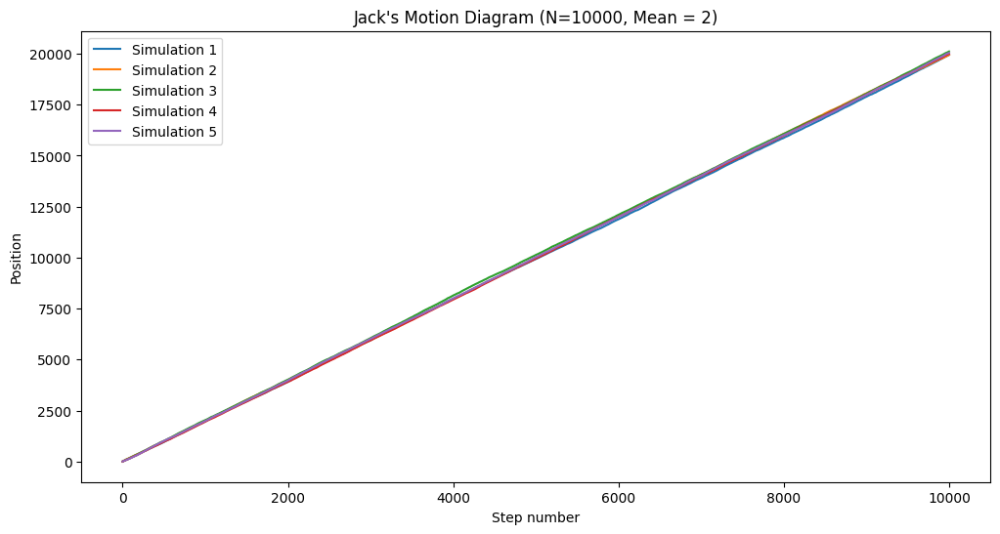

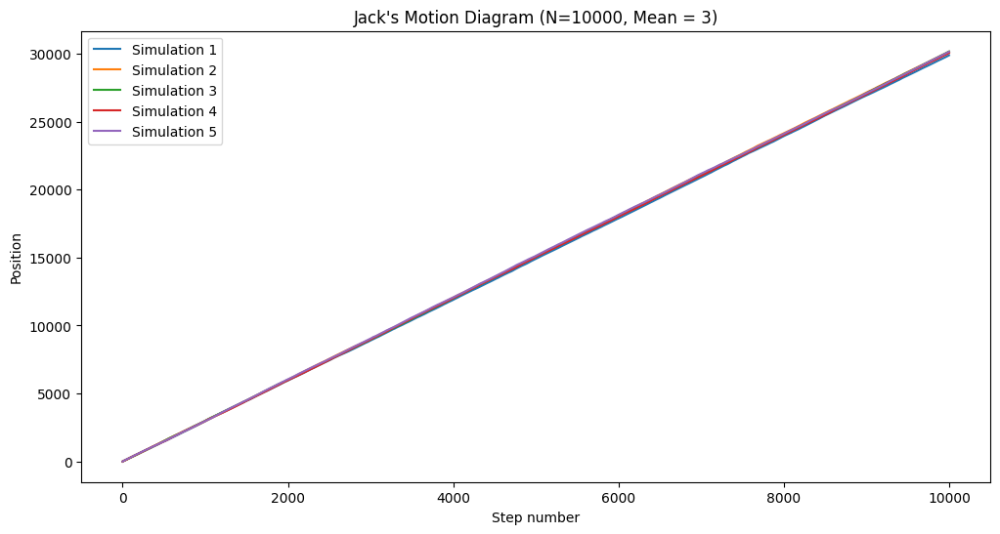

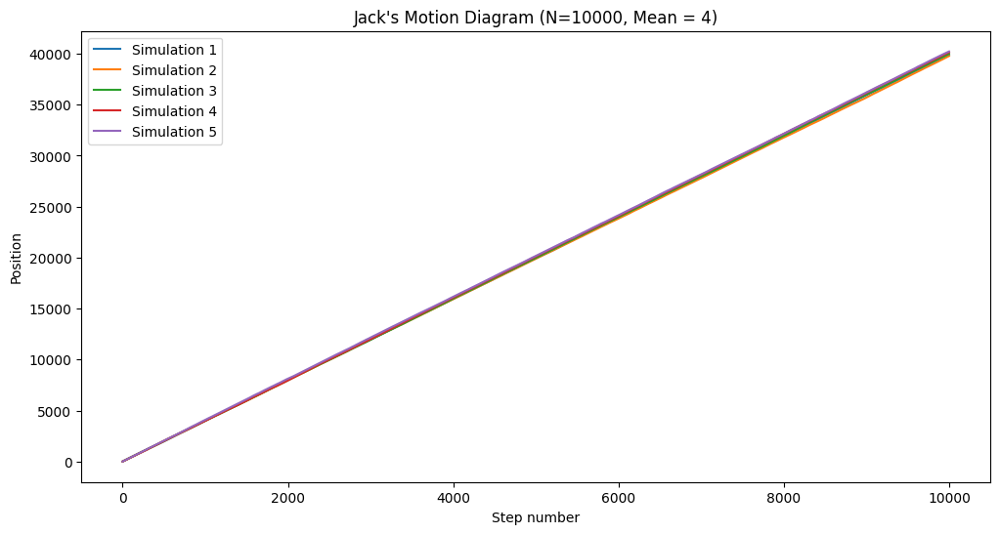

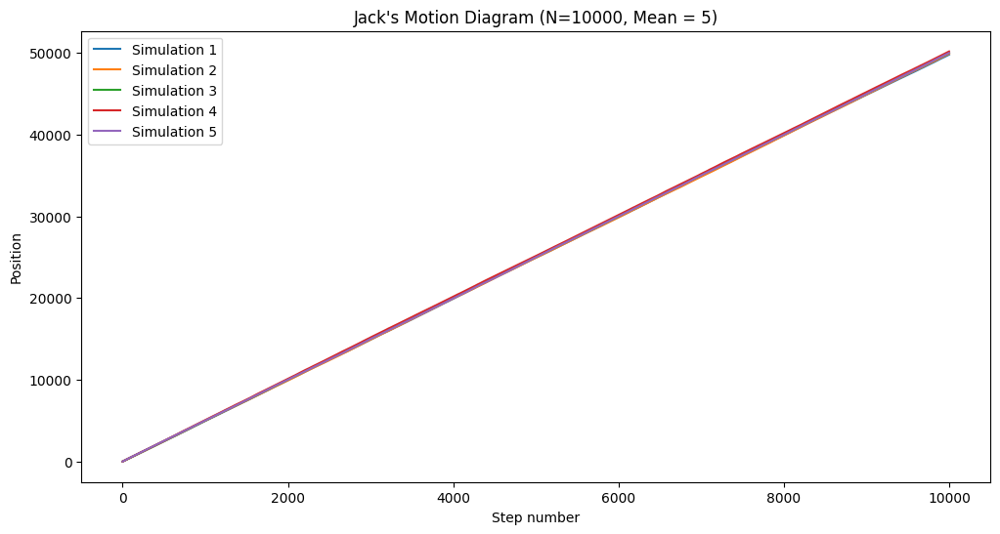

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define number of steps
N = 10000

# Define mean values for Xi
mo_values = [2, 3, 4, 5]

# Loop through different mean values and create separate plots
for mo in mo_values:
    # Create a new figure for each mean value
    plt.figure(figsize=(12, 6))

    # Simulate and plot Jack's motion for the current mean value
    for _ in range(5):  # Simulate each mean five times
        steps = np.random.normal(mo, 1, N)
        position = np.cumsum(steps)
        plt.plot(range(N), position, label=f"Simulation {_ + 1}")

    # Add labels and title for the current plot
    plt.xlabel("Step number")
    plt.ylabel("Position")
    plt.title(f"Jack's Motion Diagram (N=10000, Mean = {mo})")
    plt.legend()

    # Show the current plot
    plt.show()

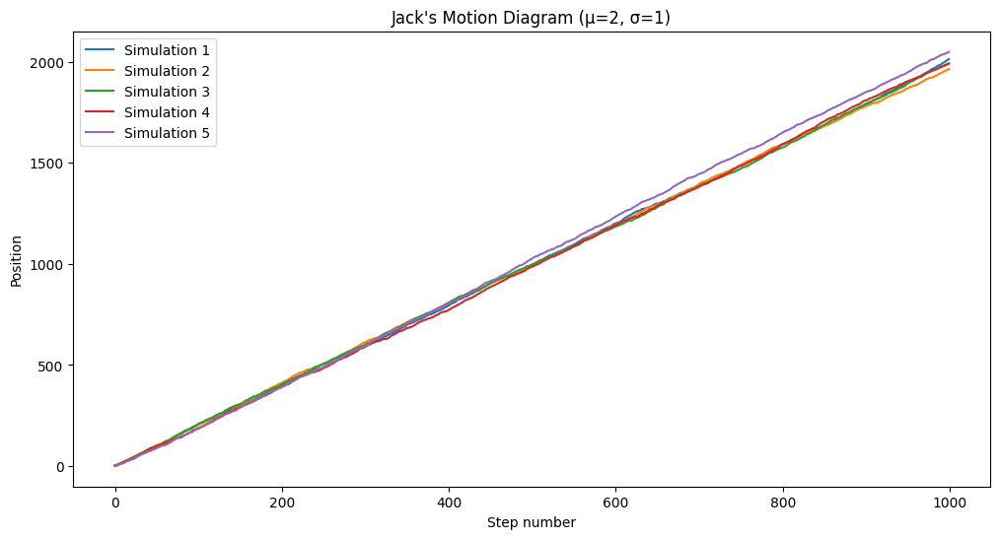

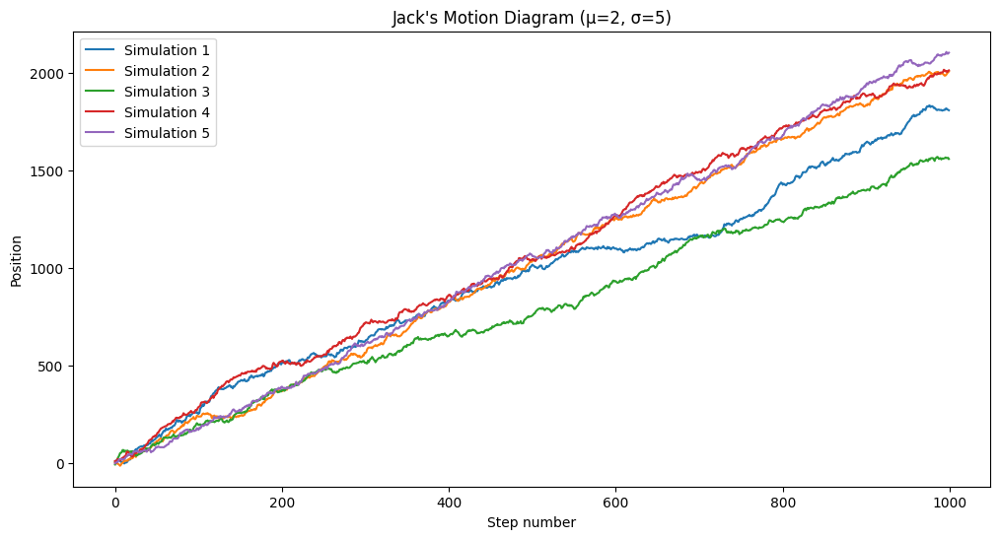

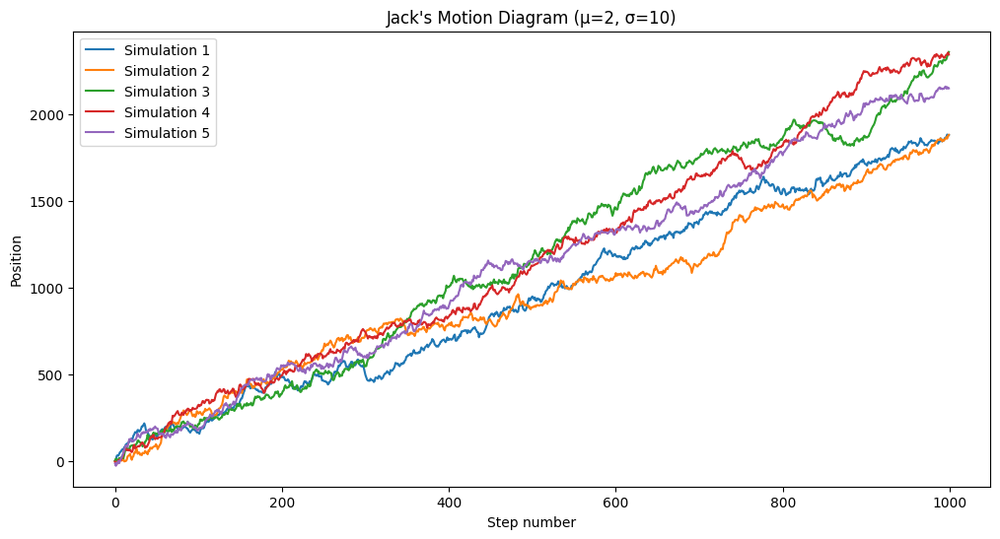

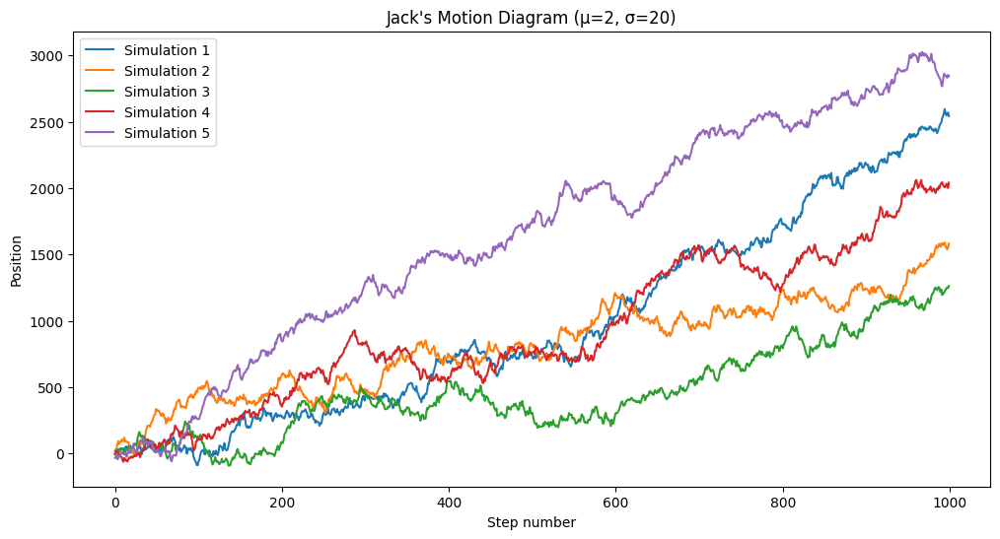

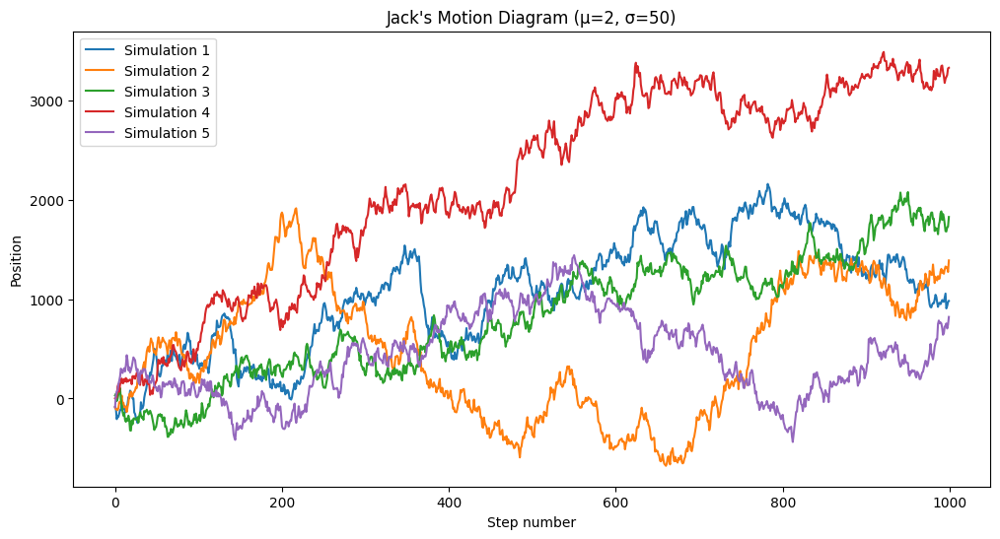

...

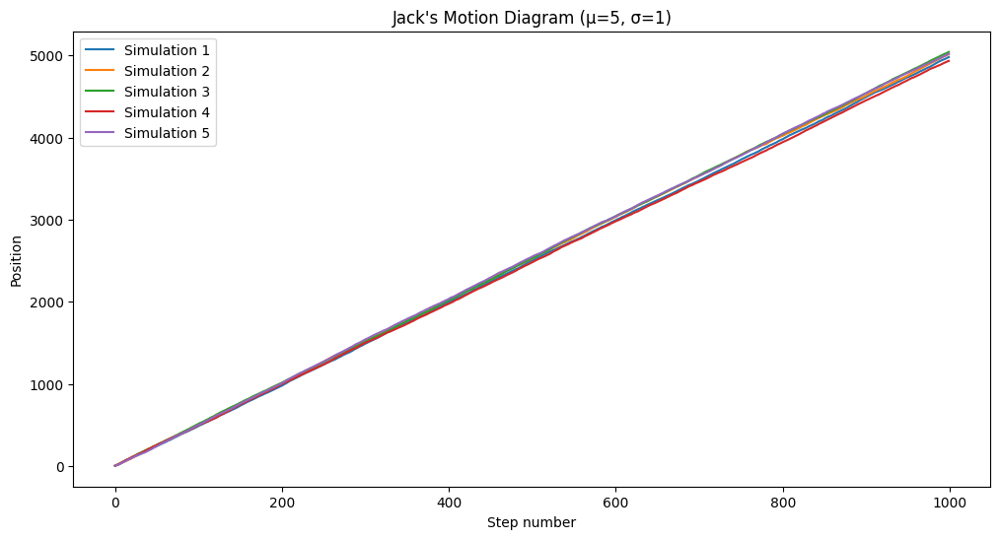

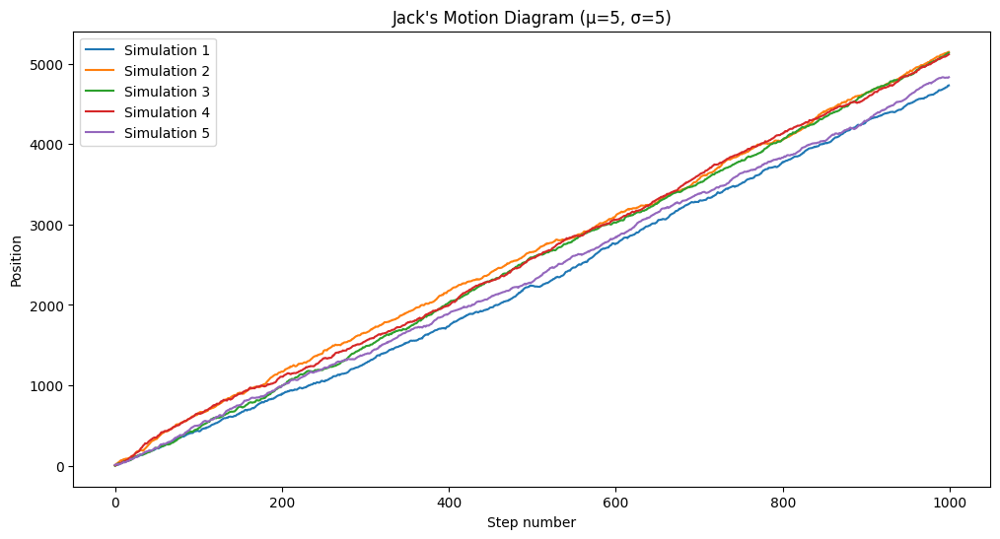

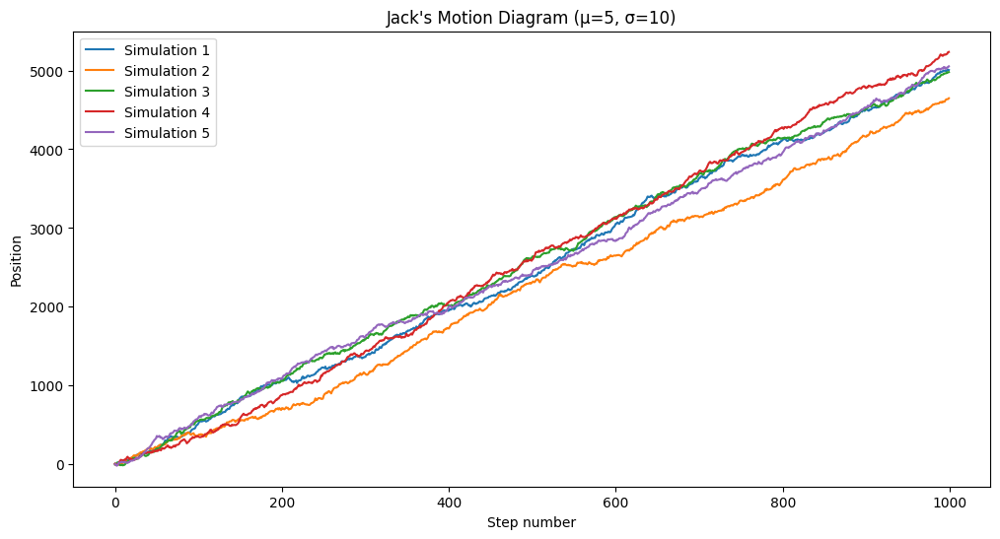

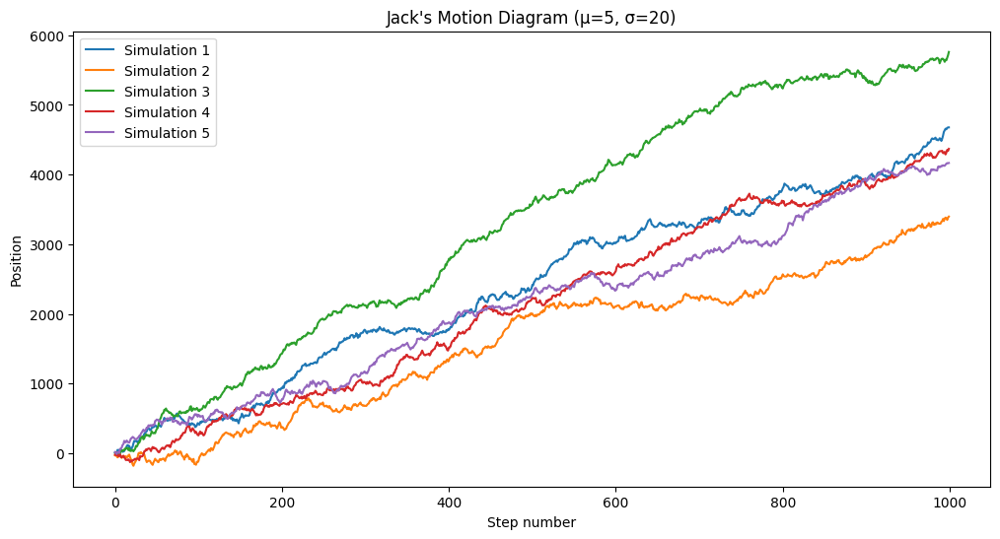

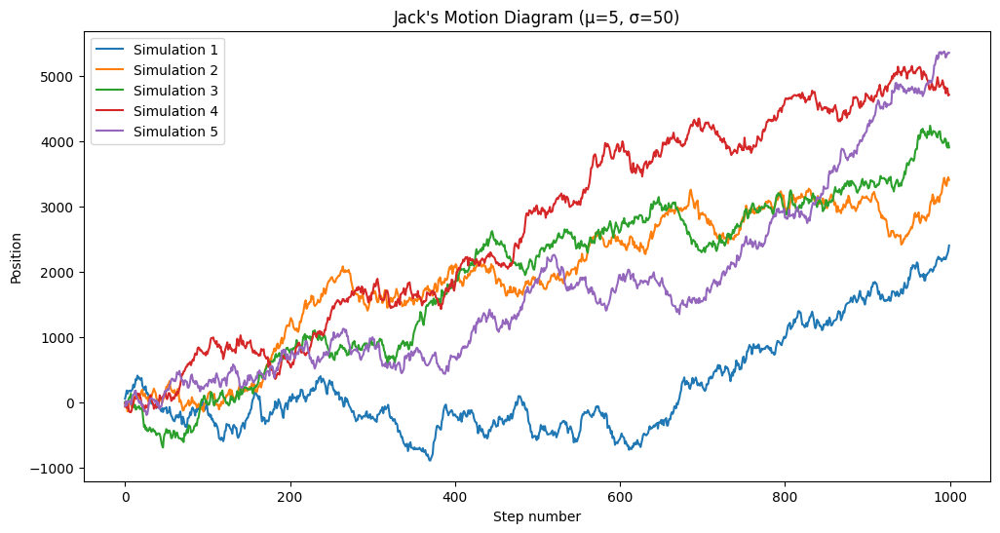

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the number of steps
N = 1000  # Number of steps in the motion

# Define mean (μ) and standard deviation values
mu_values = [2, 3, 4, 5]
sigma_values = [1, 5, 10, 20, 50]

# Loop through different mean (μ) values
for mu in mu_values:
    # Loop through different standard deviation (σ) values
    for sigma in sigma_values:
        # Create a new figure for each combination of μ and σ
        plt.figure(figsize=(12, 6))

        # Simulate and plot Jack's motion five times for the current μ and σ combination
        for _ in range(5):
            steps = np.random.normal(mu, sigma, N)
            position = np.cumsum(steps)  # Cumulative sum to simulate position
            plt.plot(position, label=f"Simulation {_ + 1}")

        # Add labels and title for the current plot
        plt.xlabel("Step number")
        plt.ylabel("Position")
        plt.title(f"Jack's Motion Diagram (μ={mu}, σ={sigma})")
        plt.legend()

        # Show the current plot
        plt.show()

## Q12

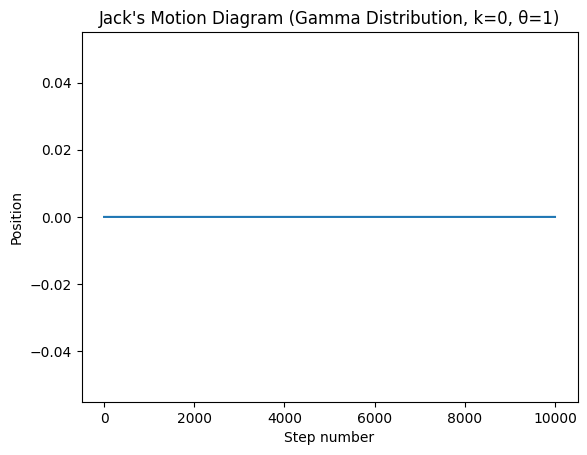

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the number of steps
N = 10000

# Initialize an array to store the position at each step
position = np.zeros(N)

# Simulate Jack's motion
for i in range(N):
    # Generate a random value from the Gamma distribution
    xi = np.random.gamma(0, 1)

    # Update Jack's position
    position[i] = position[i-1] + xi

# Plot the motion diagram
plt.plot(range(N), position)
plt.xlabel("Step number")
plt.ylabel("Position")
plt.title("Jack's Motion Diagram (Gamma Distribution, k=0, θ=1)")
plt.show()

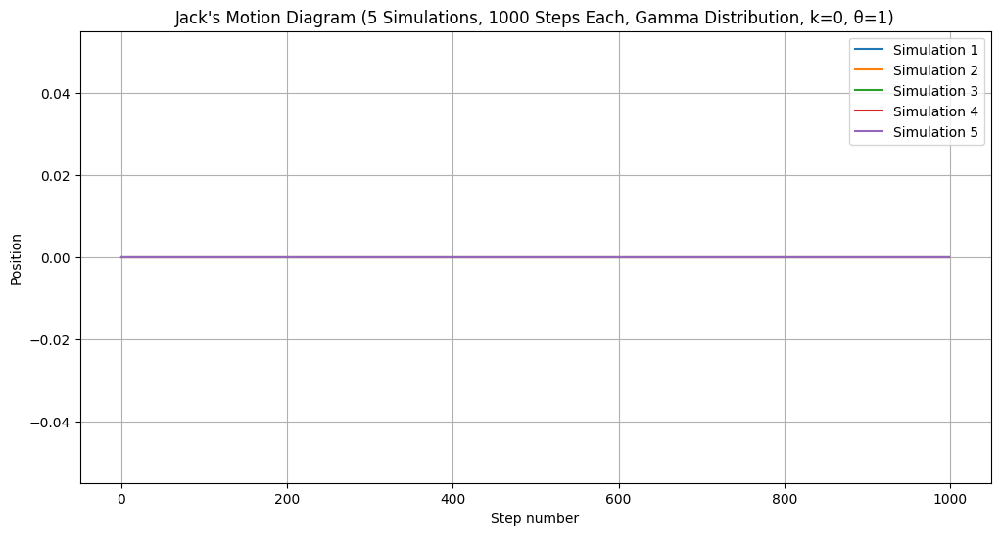

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the number of simulations and steps per simulation
num_simulations = 5
steps_per_simulation = 1000

# Initialize a list to store the position histories for each simulation
position_histories = []

# Perform the simulations
for _ in range(num_simulations):
    # Initialize an array to store the position at each step
    position = np.zeros(steps_per_simulation)

    # Simulate Jack's motion
    for i in range(1, steps_per_simulation):
        # Generate a random value from the Gamma distribution
        xi = np.random.gamma(0, 1)

        # Update Jack's position
        position[i] = position[i-1] + xi

    # Store the position history for the current simulation
    position_histories.append(position)

# Create a figure and plot the results for each simulation
plt.figure(figsize=(12, 6))
for i, position_history in enumerate(position_histories):
    plt.plot(range(steps_per_simulation), position_history, label=f'Simulation {i+1}')

plt.xlabel("Step number")
plt.ylabel("Position")
plt.title("Jack's Motion Diagram (5 Simulations, 1000 Steps Each, Gamma Distribution, k=0, θ=1)")
plt.legend()
plt.grid(True)
plt.show()

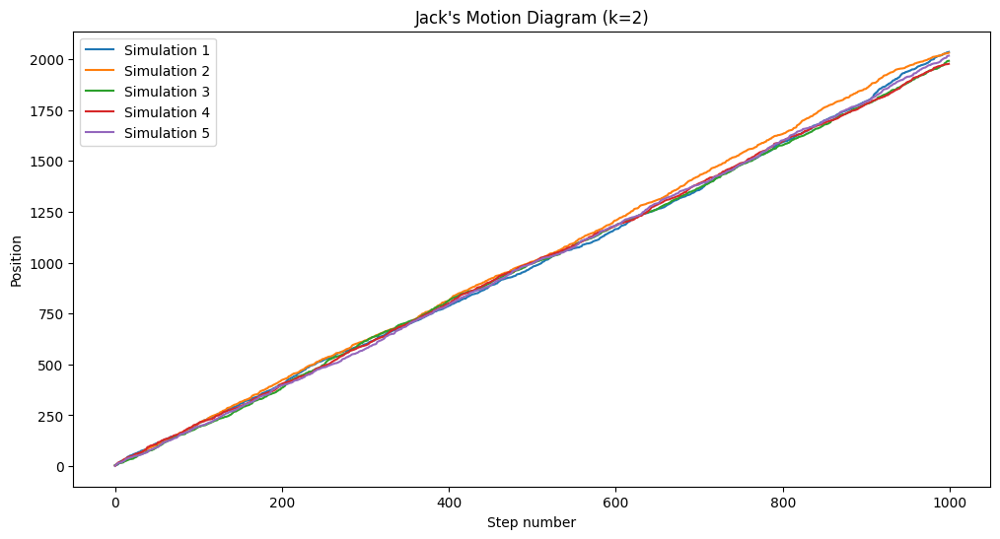

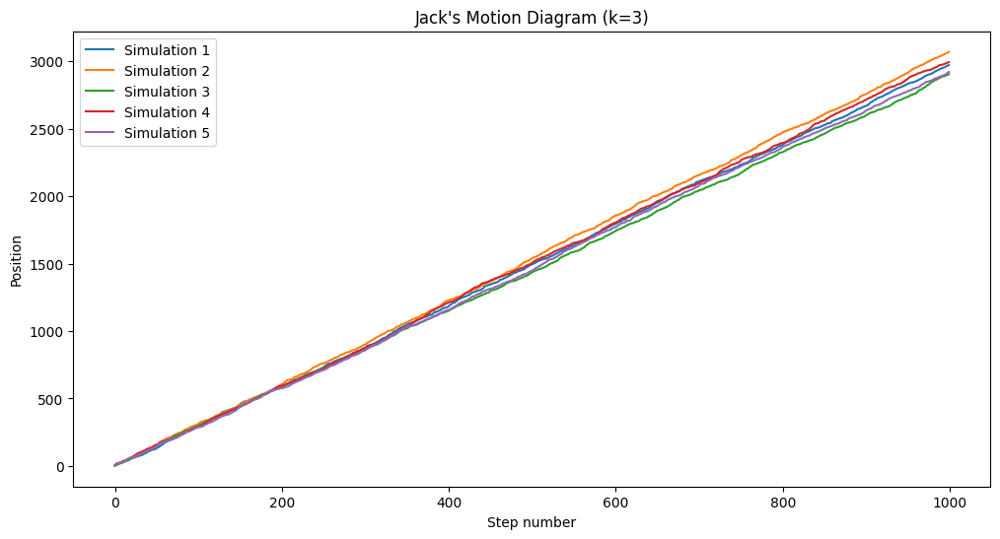

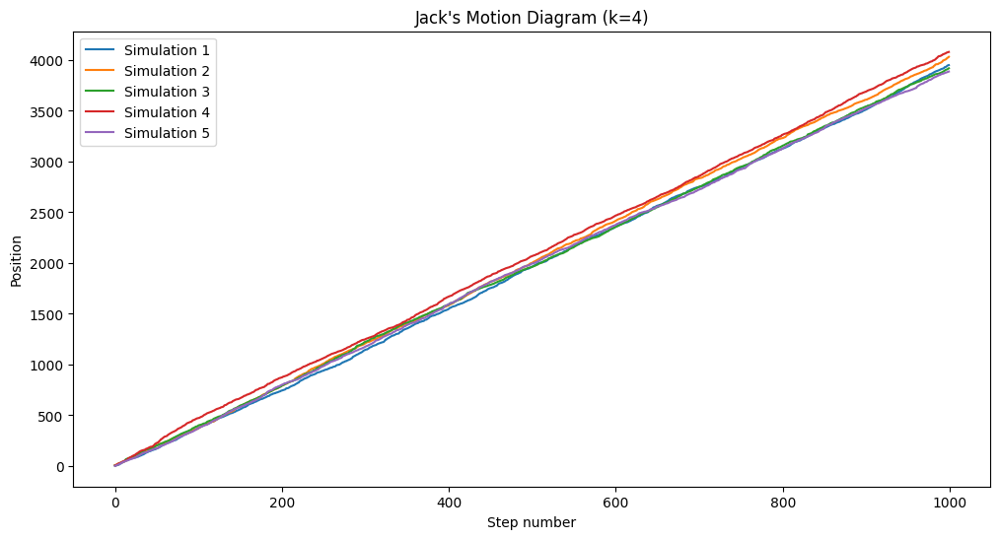

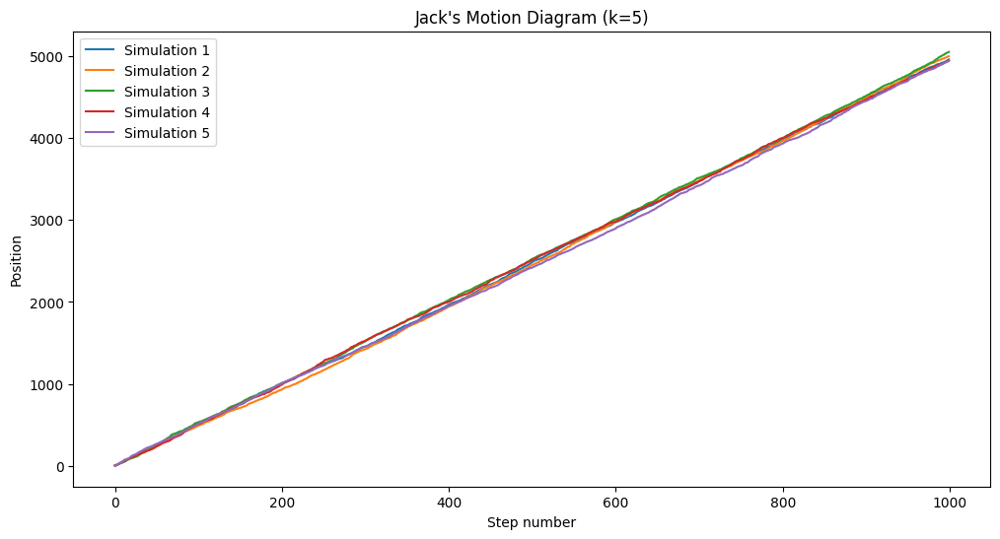

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the number of steps
N = 1000  # Number of steps in the motion

# Define k values
k_values = [2, 3, 4, 5]

# Loop through different k values
for k in k_values:
    # Create a new figure for each value of k
    plt.figure(figsize=(12, 6))

    # Simulate and plot Jack's motion five times for the current k value
    for _ in range(5):
        steps = np.random.gamma(k, 1, N)
        position = np.cumsum(steps)  # Cumulative sum to simulate position
        plt.plot(position, label=f"Simulation {_ + 1}")

    # Add labels and title for the current plot
    plt.xlabel("Step number")
    plt.ylabel("Position")
    plt.title(f"Jack's Motion Diagram (k={k})")
    plt.legend()

    # Show the current plot
    plt.show()

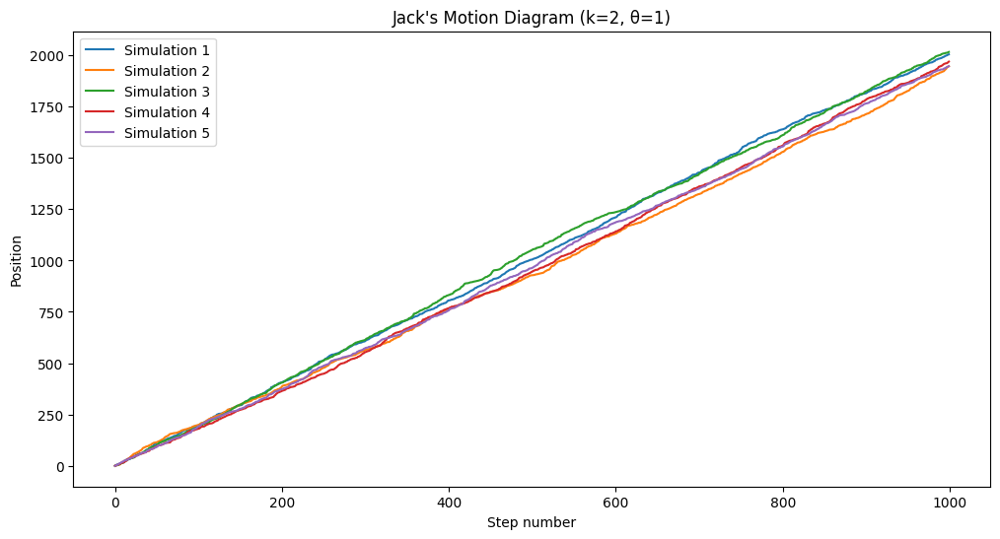

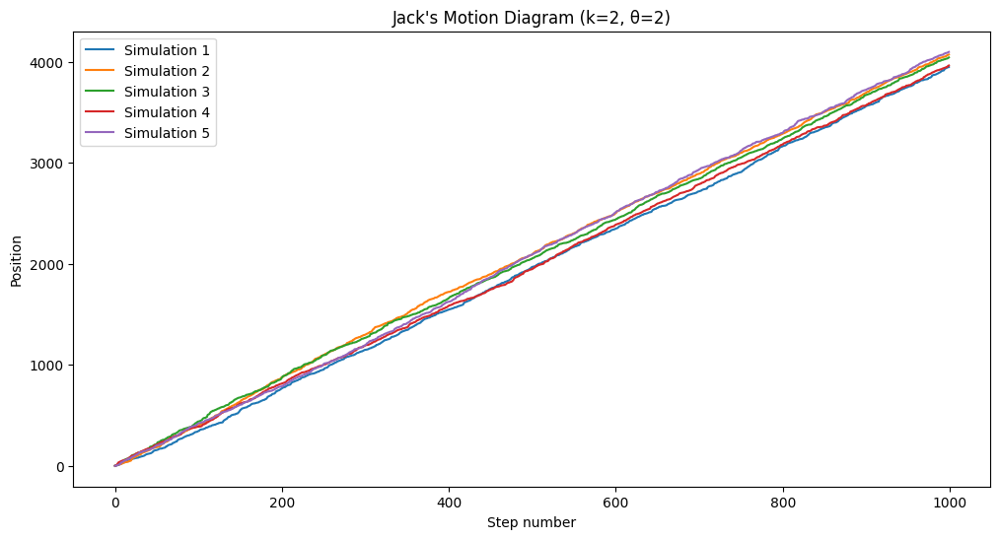

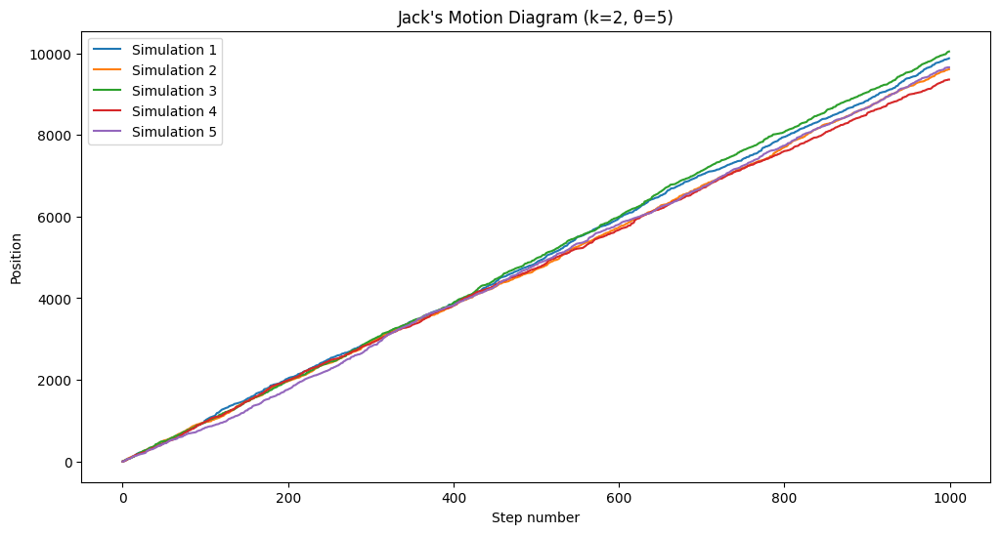

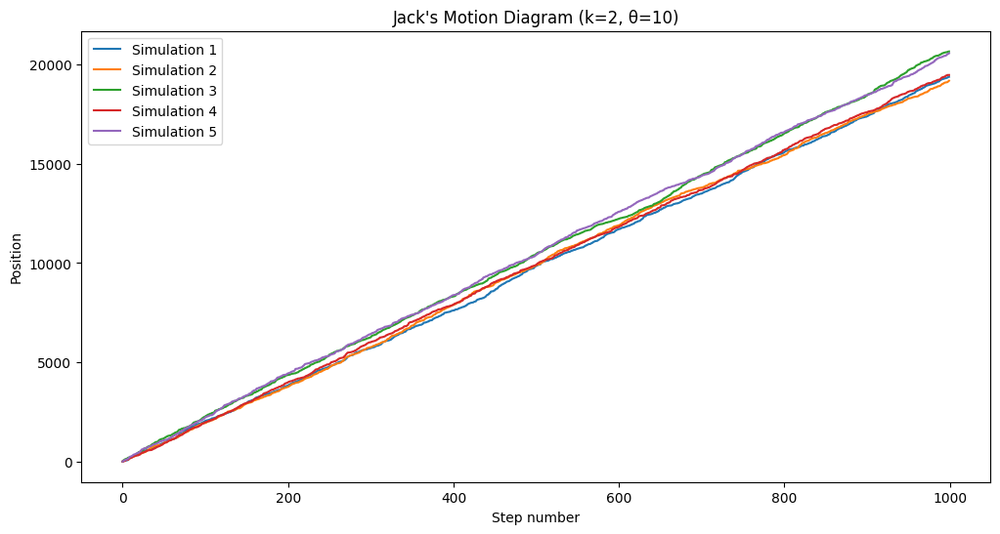

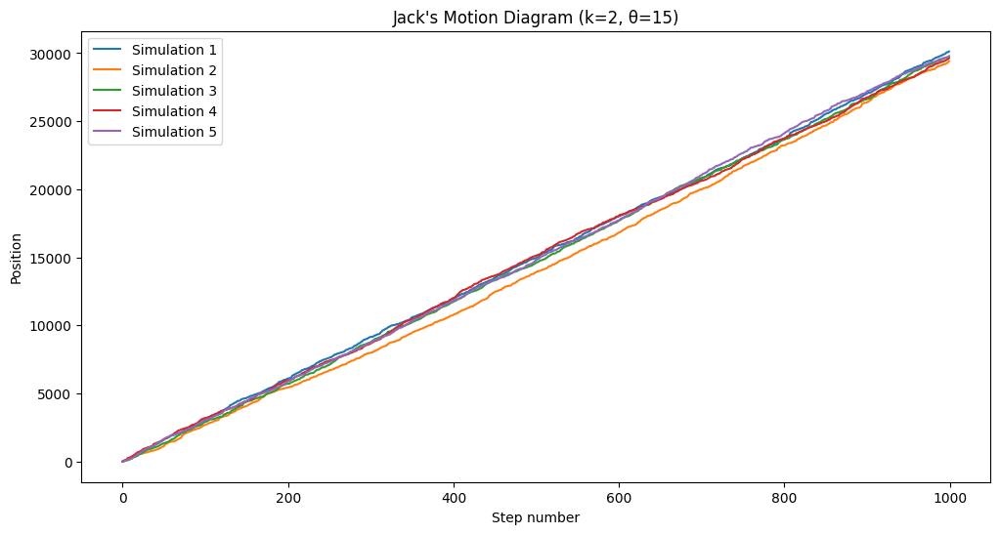

...

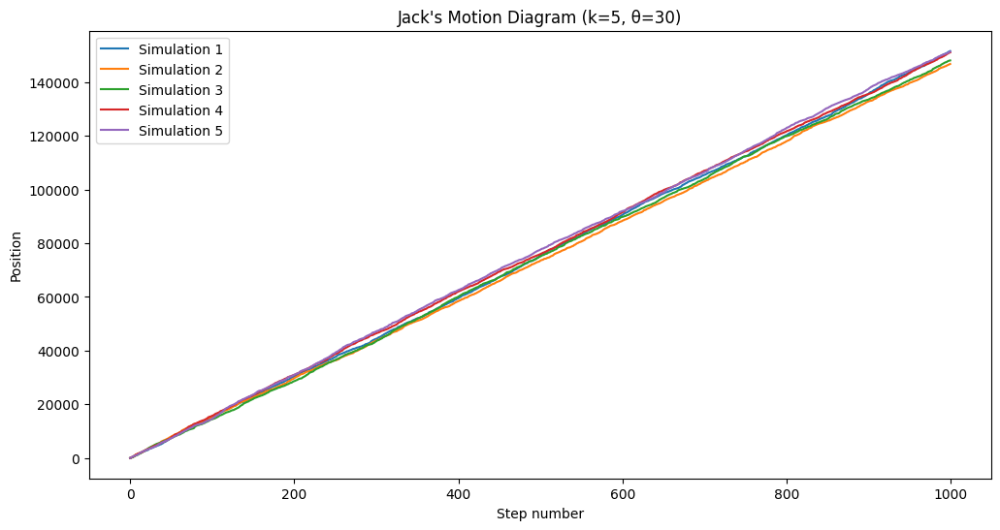

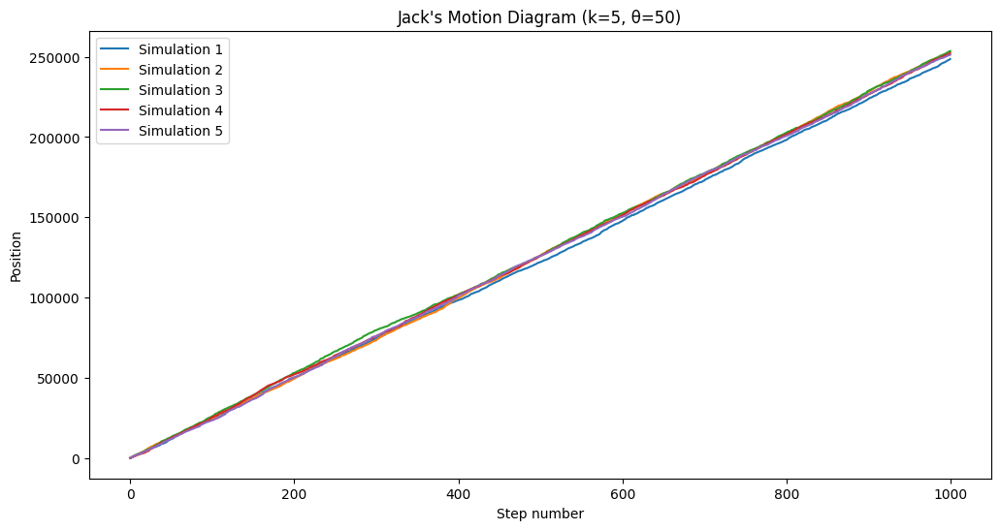

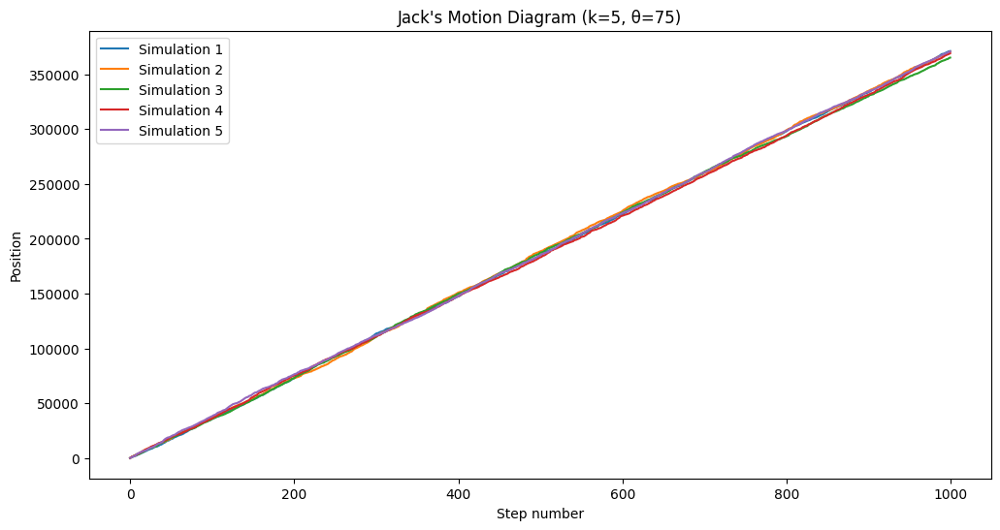

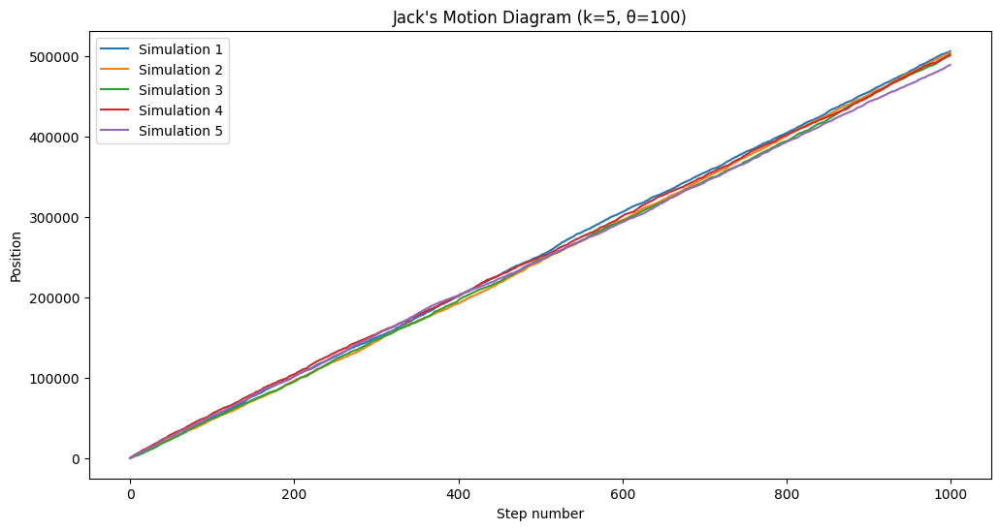

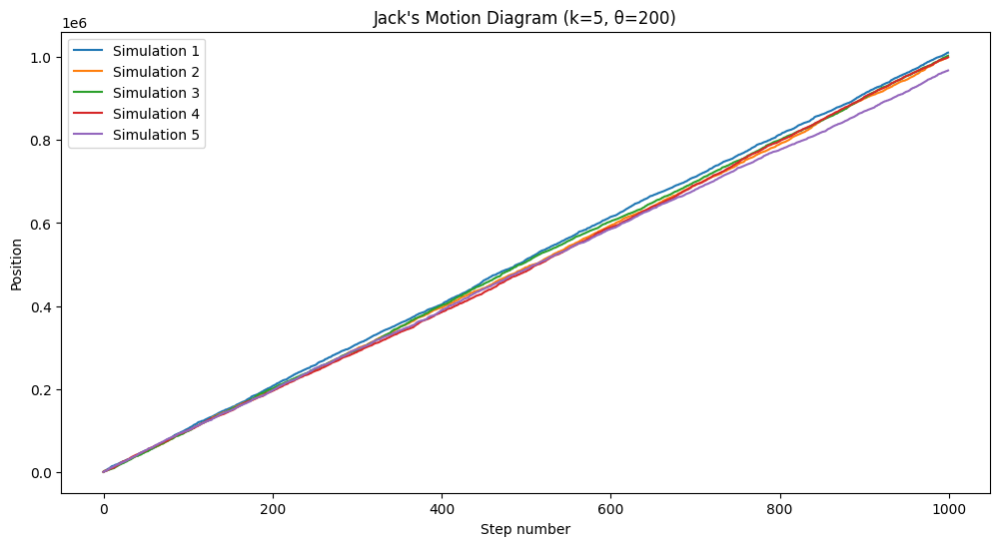

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the number of steps
N = 1000

# Define different values of k and theta to simulate
k_values = [2, 3, 4, 5]
theta_values = [1, 2, 5, 10, 15, 20, 25, 30, 50, 75, 100, 200]
num_simulations = 5  # Number of simulations for each combination

# Loop through different values of k
for k in k_values:
    # Loop through different values of theta
    for theta in theta_values:
        # Create a new figure for each combination of k and theta
        plt.figure(figsize=(12, 6))

        # Simulate and plot Jack's motion five times for the current combination
        for _ in range(num_simulations):
            # Initialize an array to store the position at each step
            position = np.zeros(N)

            # Simulate Jack's motion
            for i in range(1, N):
                # Generate a random value from the Gamma distribution with k and theta
                xi = np.random.gamma(k, theta)

                # Update Jack's position
                position[i] = position[i-1] + xi

            # Plot the motion for this combination of k and theta
            plt.plot(range(N), position, label=f'Simulation {_ + 1}')

        # Add labels and title for the current plot
        plt.xlabel("Step number")
        plt.ylabel("Position")
        plt.title(f"Jack's Motion Diagram (k={k}, θ={theta})")
        plt.legend()

        # Show the current plot
        plt.show()

## Q13

In [ ]:
import numpy as np

# Define the number of simulations and steps per simulation
num_simulations = 10000
max_steps = 100

# Initialize a variable to count the number of times Jack returns to the origin
return_count = 0

# Perform the simulations
for _ in range(num_simulations):
    position = 0  # Initialize Jack's position to 0

    for step in range(1, max_steps + 1):
        # Generate a random value for X_i based on the given probability distribution
        xi = np.random.choice([1, -1], p=[0.5, 0.5])

        # Update Jack's position
        position += xi

        # Check if Jack returns to the origin
        if position == 0:
            return_count += 1
            break

# Calculate the probability of returning to the origin
probability_return = return_count / num_simulations

# Print the results
print(f"Number of times Jack returns to the origin: {return_count}")
print(f"Probability of returning to the origin: {probability_return}")

Number of times Jack returns to the origin: 9196
Probability of returning to the origin: 0.9196


In [ ]:
import numpy as np

# Define the number of simulations and steps per simulation
num_simulations = 10000
max_steps = 1000

# Initialize a variable to count the number of times Jack returns to the origin
return_count = 0

# Perform the simulations
for _ in range(num_simulations):
    position = 0  # Initialize Jack's position to 0

    for step in range(1, max_steps + 1):
        # Generate a random value for X_i based on the given probability distribution
        xi = np.random.choice([1, -1], p=[0.5, 0.5])

        # Update Jack's position
        position += xi

        # Check if Jack returns to the origin
        if position == 0:
            return_count += 1
            break

# Calculate the probability of returning to the origin
probability_return = return_count / num_simulations

# Print the results
print(f"Number of times Jack returns to the origin: {return_count}")
print(f"Probability of returning to the origin: {probability_return}")

Number of times Jack returns to the origin: 9729
Probability of returning to the origin: 0.9729


### Shows that the as the number of steps goes up the probablity of returning to the origin gets closer to 1

In [ ]:
import numpy as np

# Define the number of simulations and steps per simulation
num_simulations = 10000
max_steps = 100

# Initialize a variable to count the number of times Jack returns to the origin
return_count = 0

# Perform the simulations
for _ in range(num_simulations):
    position = 0  # Initialize Jack's position to 0

    for step in range(1, max_steps + 1):
        # Generate a random value for X_i based on the updated probability distribution
        xi = np.random.choice([1, -1], p=[2/3, 1/3])

        # Update Jack's position
        position += xi

        # Check if Jack returns to the origin
        if position == 0:
            return_count += 1
            break

# Calculate the probability of returning to the origin
probability_return = return_count / num_simulations

# Print the results
print(f"Number of times Jack returns to the origin: {return_count}")
print(f"Probability of returning to the origin: {probability_return}")

Number of times Jack returns to the origin: 6646
Probability of returning to the origin: 0.6646


In [ ]:
import numpy as np

# Define the number of simulations and steps per simulation
num_simulations = 10000
max_steps = 1000

# Initialize a variable to count the number of times Jack returns to the origin
return_count = 0

# Perform the simulations
for _ in range(num_simulations):
    position = 0  # Initialize Jack's position to 0

    for step in range(1, max_steps + 1):
        # Generate a random value for X_i based on the updated probability distribution
        xi = np.random.choice([1, -1], p=[2/3, 1/3])

        # Update Jack's position
        position += xi

        # Check if Jack returns to the origin
        if position == 0:
            return_count += 1
            break

# Calculate the probability of returning to the origin
probability_return = return_count / num_simulations

# Print the results
print(f"Number of times Jack returns to the origin: {return_count}")
print(f"Probability of returning to the origin: {probability_return}")

Number of times Jack returns to the origin: 6692
Probability of returning to the origin: 0.6692


## This time the value of probablity doesnt have an obvious relation with the number of steps

## Q14

In [ ]:
import numpy as np

# Function to check if Jack reaches the specified positions
def check_if_reached(n, l, h):
    pos = 0
    for i in range(n):
        pos += np.random.choice([1, -1], p=[0.5, 0.5])
        if pos == l:
            return True
        elif pos == h:
            return False
    return False

# Simulate and calculate probabilities
for j in range(5, 31, 5):
    count = 0
    num_simulations = 1000

    for i in range(num_simulations):
        if check_if_reached(1000, -1, j):
            count += 1

    probability = count / num_simulations
    print(f'Probability of reaching -1 earlier than {j} is {probability:.3f}')

Probability of reaching -1 earlier than 5 is 0.832
Probability of reaching -1 earlier than 10 is 0.929
Probability of reaching -1 earlier than 15 is 0.943
Probability of reaching -1 earlier than 20 is 0.952
Probability of reaching -1 earlier than 25 is 0.962
Probability of reaching -1 earlier than 30 is 0.959


## Q15

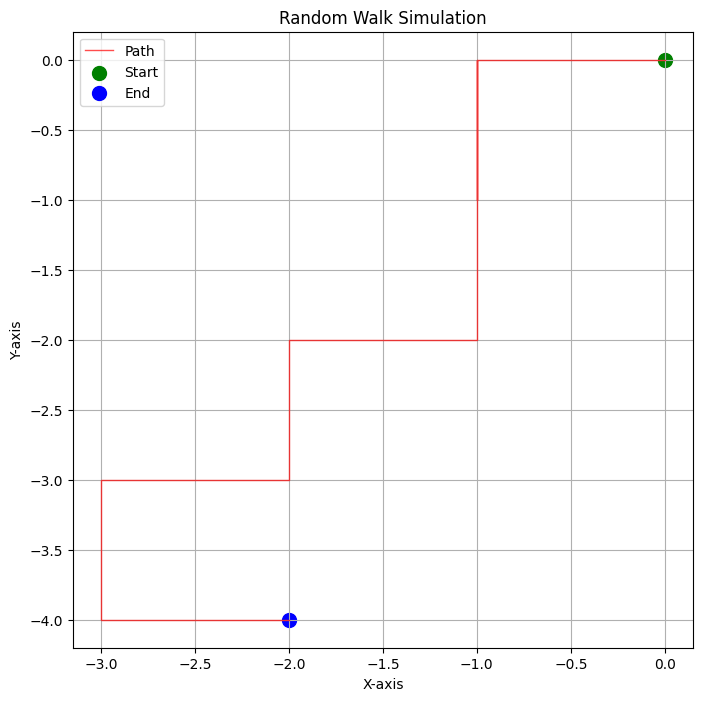

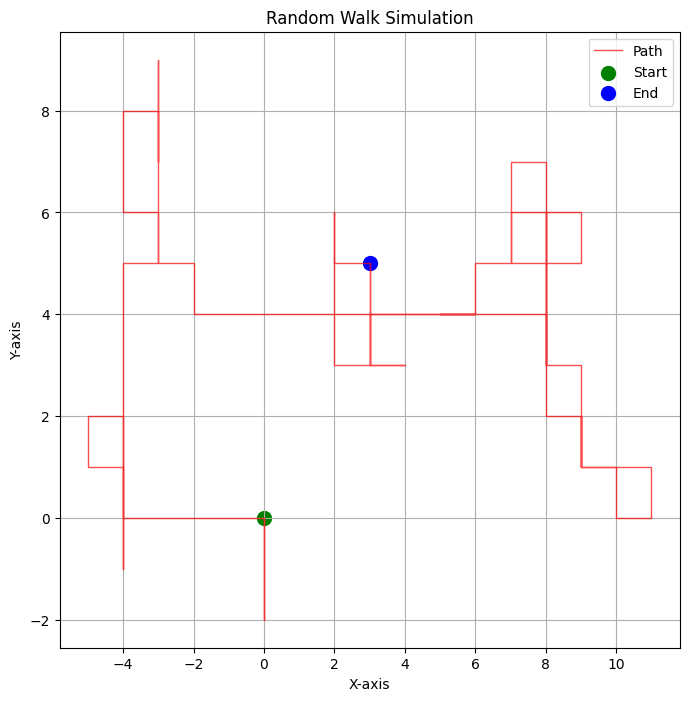

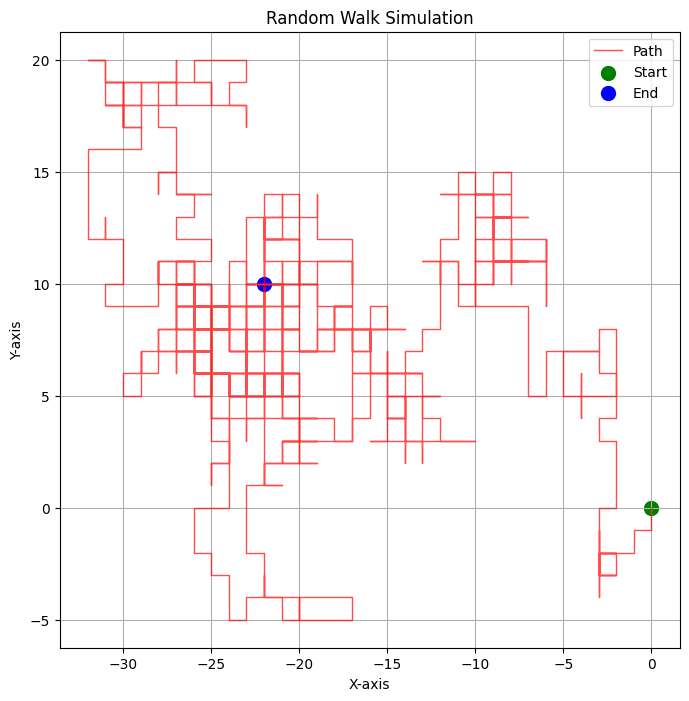

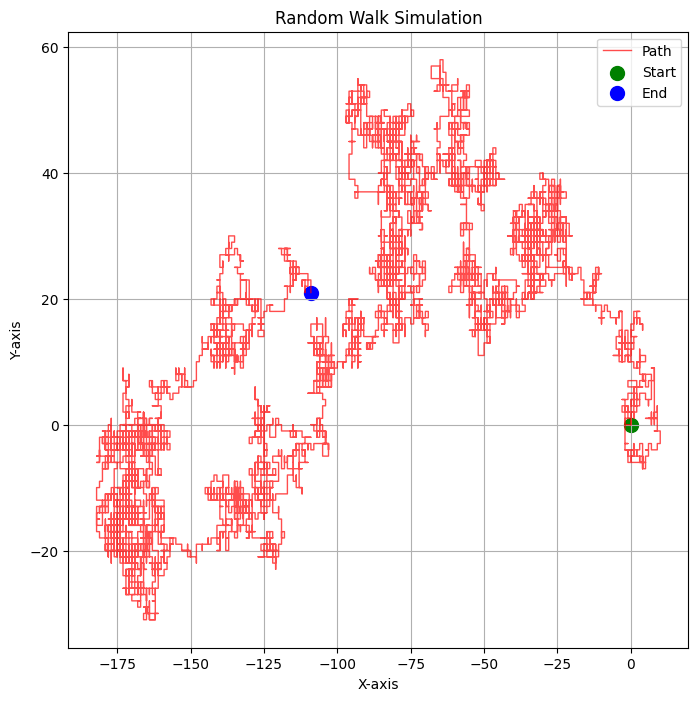

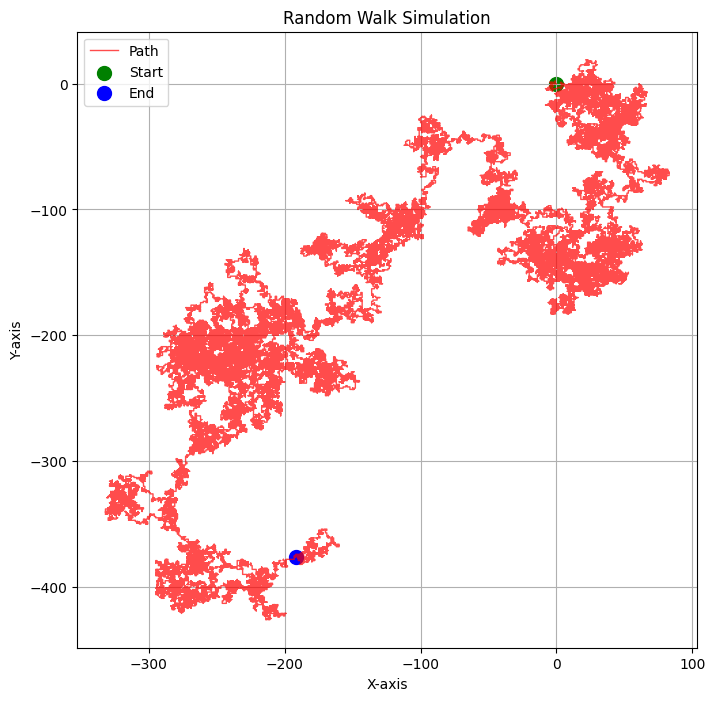

In [ ]:
  import numpy as np
import matplotlib.pyplot as plt

# Define possible movements and their probabilities
movements = np.array([[1, 0], [-1, 0], [0, 1], [0, -1]])
probabilities = np.array([0.25, 0.25, 0.25, 0.25])

def simulate_movement(n):
    positions = [np.array([0, 0])]
    for _ in range(n):
        movement = movements[np.random.choice(4, p=probabilities)]
        new_position = positions[-1] + movement
        positions.append(new_position)
    return np.array(positions)

def draw_position_diagram(positions):
    plt.figure(figsize=(8, 8))

    # Plot the path
    plt.plot(positions[:, 0], positions[:, 1], color='red', linestyle='-', linewidth=1, alpha=0.7, label='Path')

    # Mark the start and end points
    plt.scatter(positions[0, 0], positions[0, 1], c='green', marker='o', label='Start', s=100)
    plt.scatter(positions[-1, 0], positions[-1, 1], c='blue', marker='o', label='End', s=100)

    # Customize plot
    plt.legend()
    plt.grid(True)
    plt.title('Random Walk Simulation')
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')
    plt.show()

# Simulate and draw for different numbers of steps
n_steps = [10, 100, 1000, 10000, 100000]
for n in n_steps:
    positions = simulate_movement(n)
    draw_position_diagram(positions)

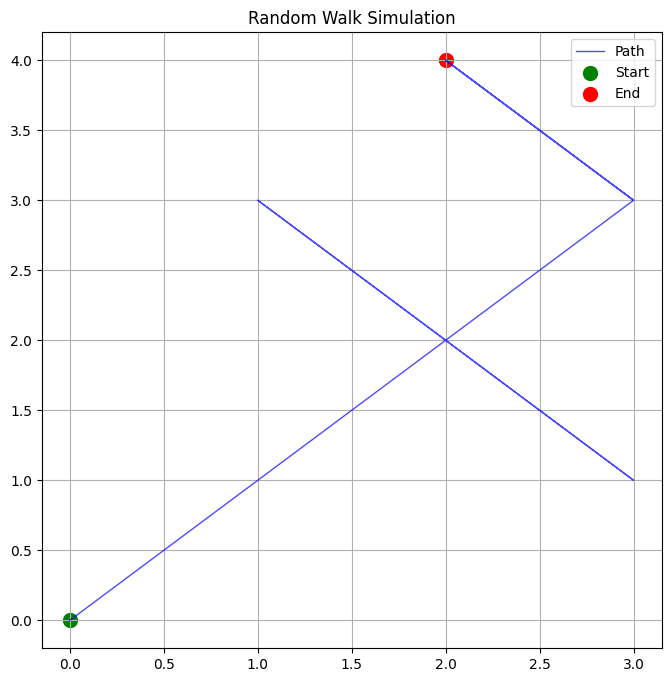

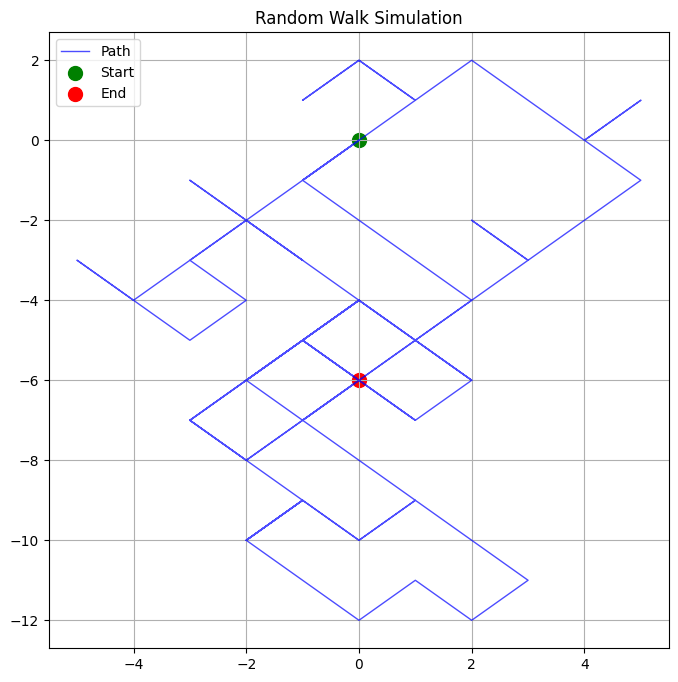

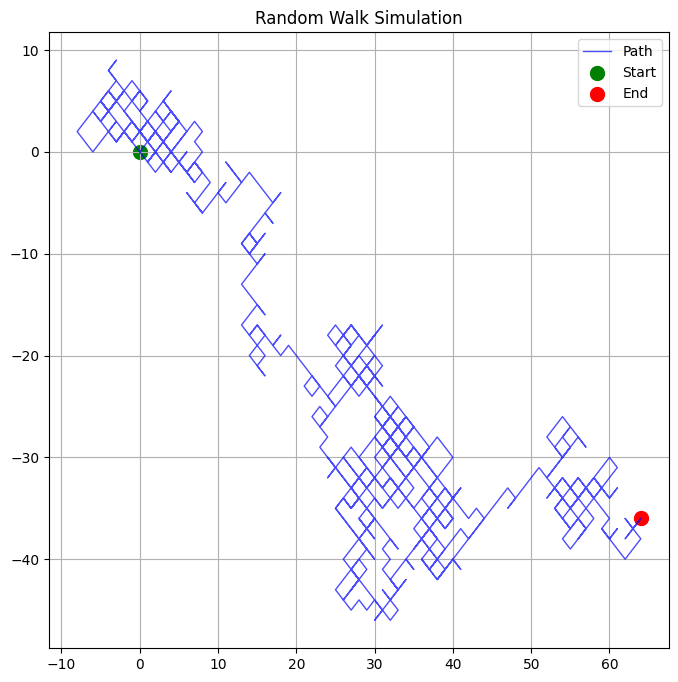

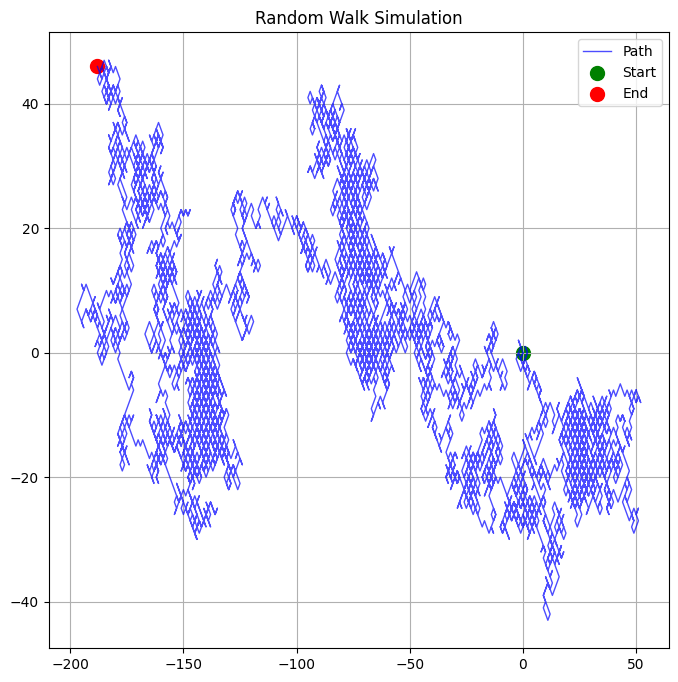

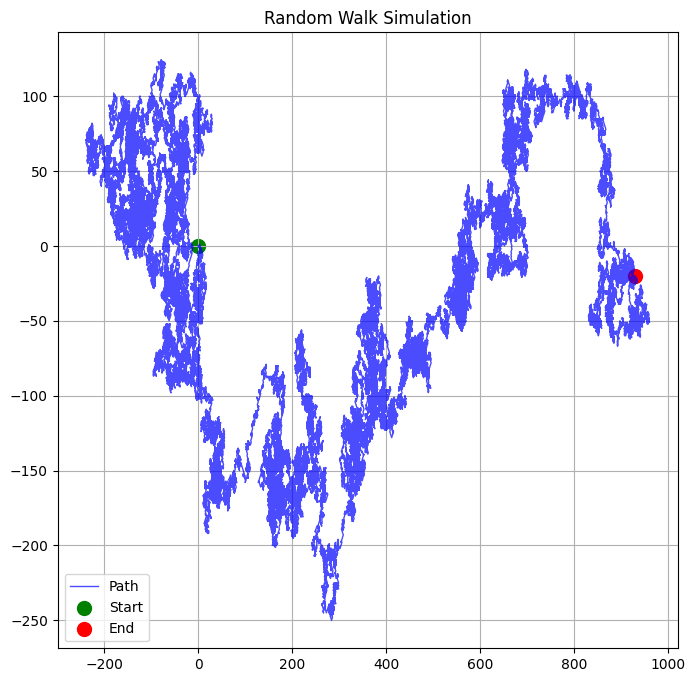

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define possible movements and their probabilities
movements = np.array([[1, 1], [-1, 1], [1, -1], [-1, -1]])
probabilities = np.array([0.25, 0.25, 0.25, 0.25])

def simulate_movement(n):
    positions = [np.array([0, 0])]
    for _ in range(n):
        movement = movements[np.random.choice(4, p=probabilities)]
        new_position = positions[-1] + movement
        positions.append(new_position)
    return np.array(positions)

def draw_position_diagram(positions):
    plt.figure(figsize=(8, 8))

    # Plot the path
    plt.plot(positions[:, 0], positions[:, 1], color='blue', linestyle='-', linewidth=1, alpha=0.7, label='Path')

    # Mark the start and end points
    plt.scatter(positions[0, 0], positions[0, 1], c='green', marker='o', label='Start', s=100)
    plt.scatter(positions[-1, 0], positions[-1, 1], c='red', marker='o', label='End', s=100)

    # Customize plot
    plt.legend()
    plt.grid(True)
    plt.title('Random Walk Simulation')
    plt.show()

# Simulate and draw for different numbers of steps
n_steps = [10, 100, 1000, 10000, 100000]
for n in n_steps:
    positions = simulate_movement(n)
    draw_position_diagram(positions)

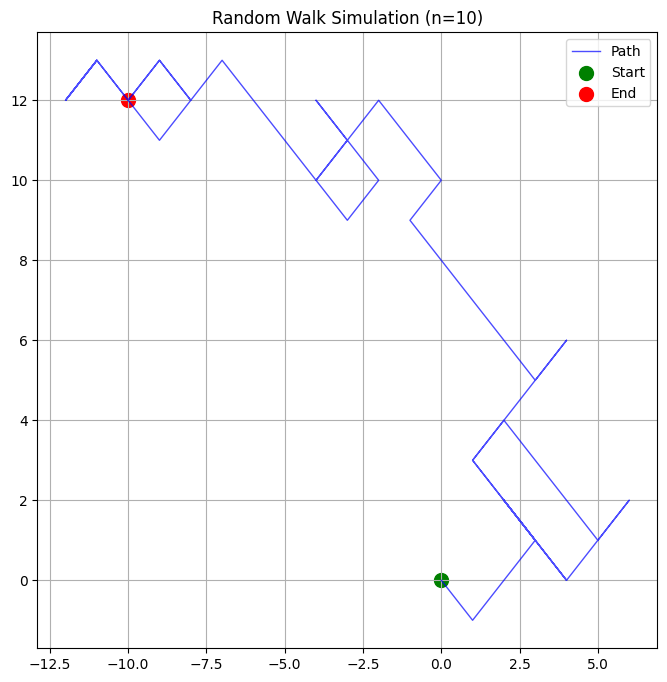

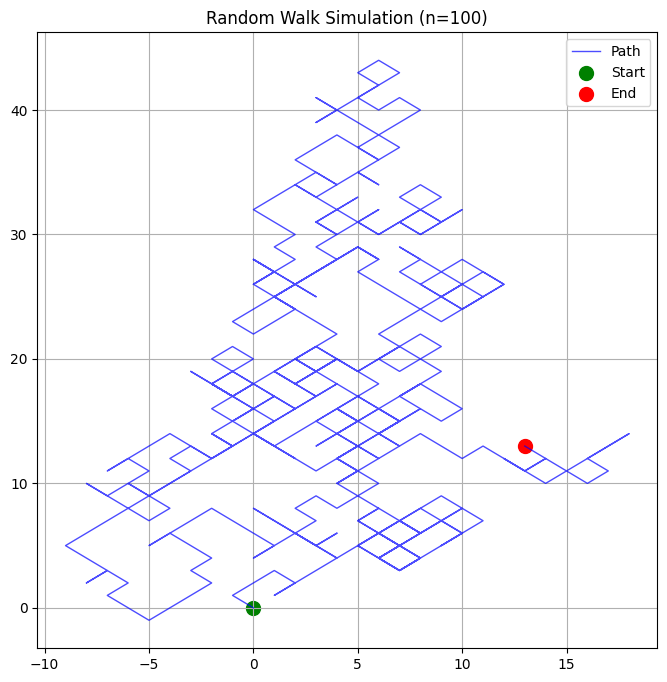

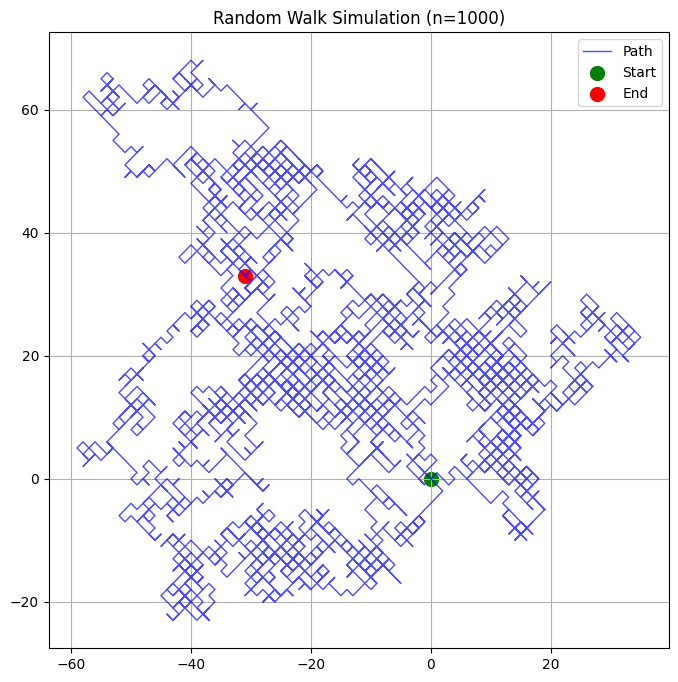

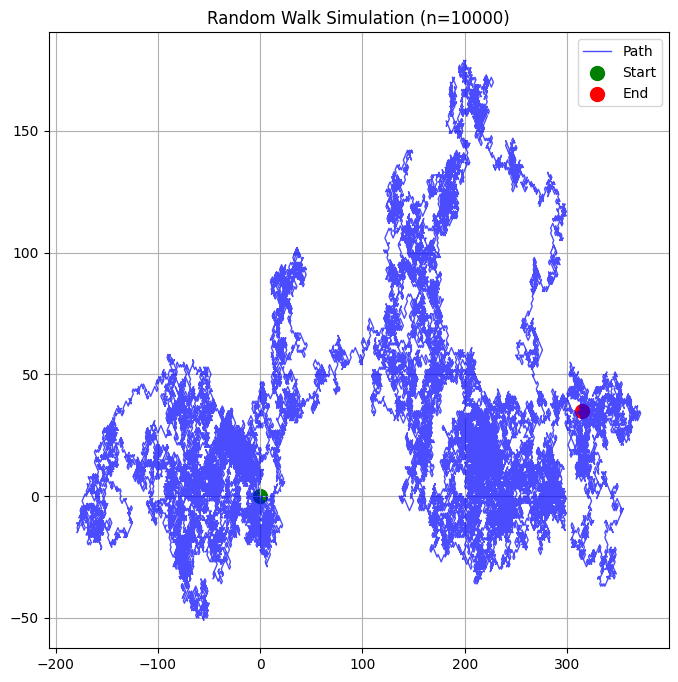

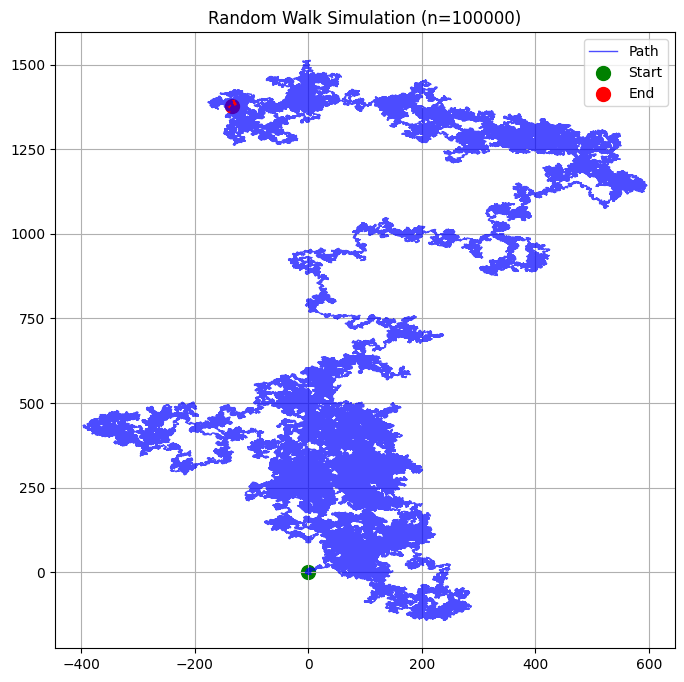

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

movements = np.array([[1, 1], [-1, 1], [1, -1], [-1, -1]])
probabilities = np.array([0.25, 0.25, 0.25, 0.25])

def simulate_movement(n):
    positions = [np.array([0, 0])]
    for _ in range(n):
        num_steps = np.random.randint(1, 11)
        for _ in range(num_steps):
            movement = movements[np.random.choice(4, p=probabilities)]
            new_position = positions[-1] + movement
            positions.append(new_position)
    return np.array(positions)

def draw_position_diagram(num_moves):
    positions = simulate_movement(num_moves)
    plt.figure(figsize=(8, 8))

    # Plot the path
    plt.plot(positions[:, 0], positions[:, 1], color='blue', linestyle='-', linewidth=1, alpha=0.7, label='Path')

    # Mark the start and end points
    plt.scatter(positions[0, 0], positions[0, 1], c='green', marker='o', label='Start', s=100)
    plt.scatter(positions[-1, 0], positions[-1, 1], c='red', marker='o', label='End', s=100)

    # Customize plot
    plt.legend()
    plt.grid(True)
    plt.title(f'Random Walk Simulation (n={num_moves})')
    plt.show()

# Draw the position diagram for different numbers of moves
n_values = [10, 100, 1000, 10000, 100000]
for n in n_values:
    draw_position_diagram(n)

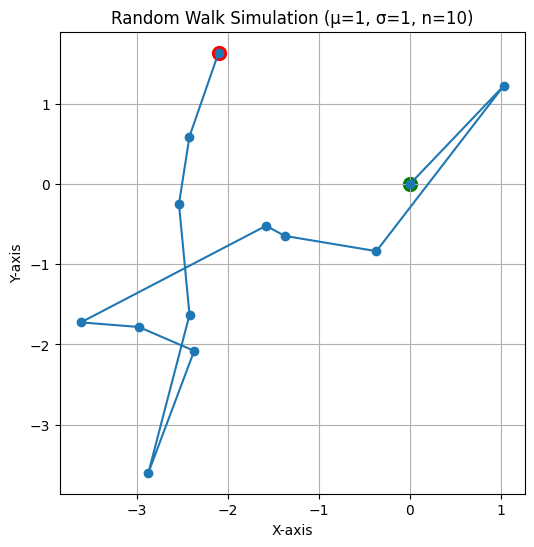

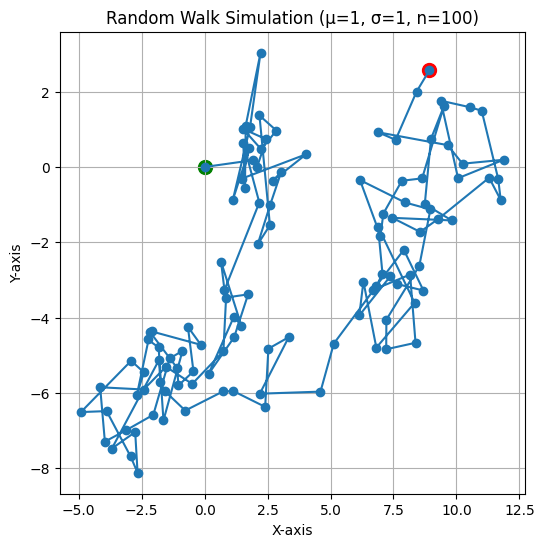

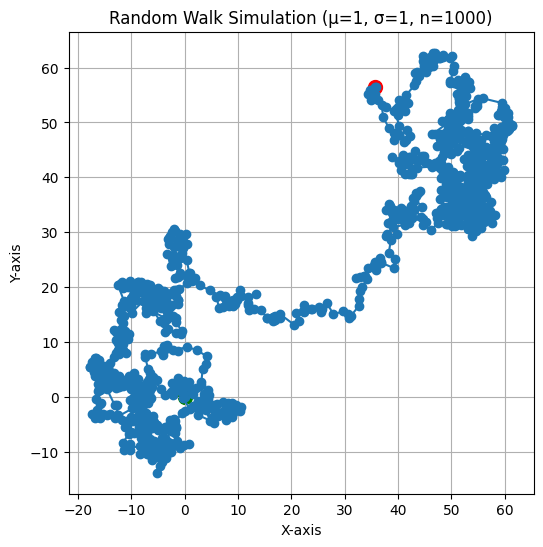

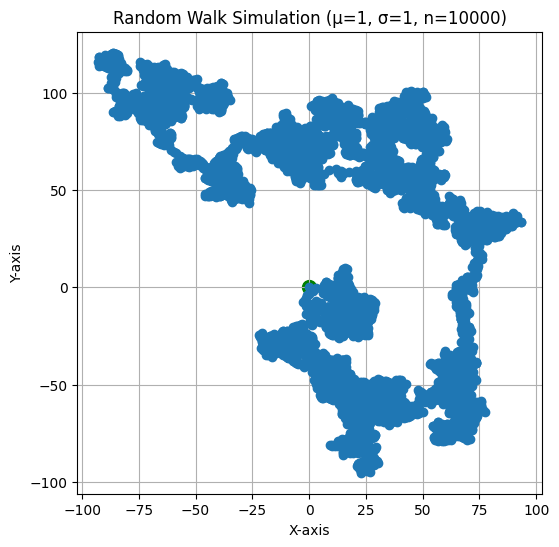

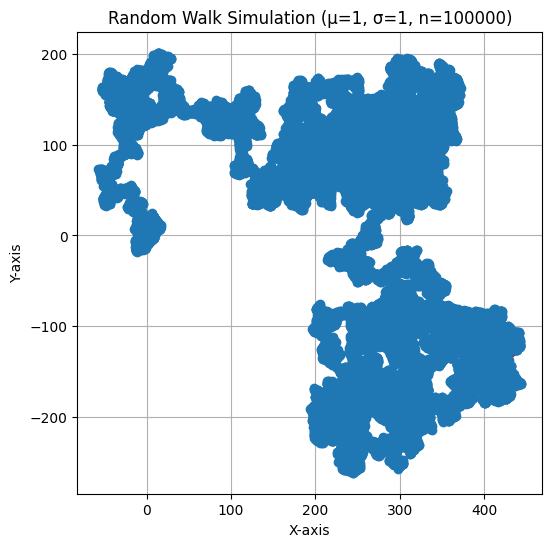

...

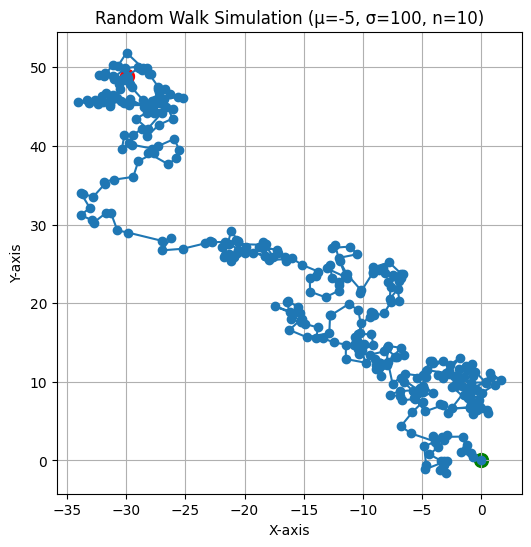

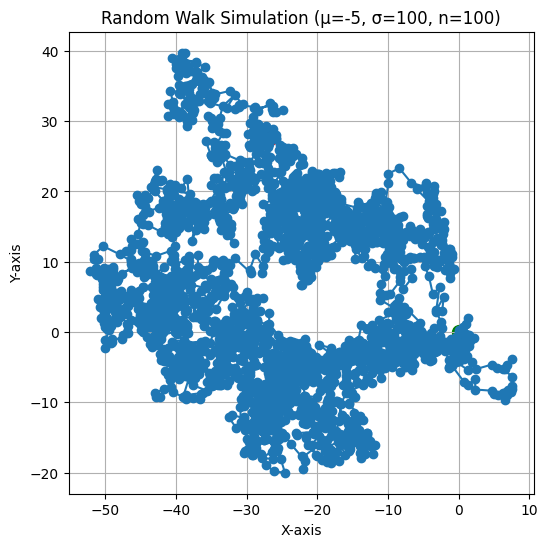

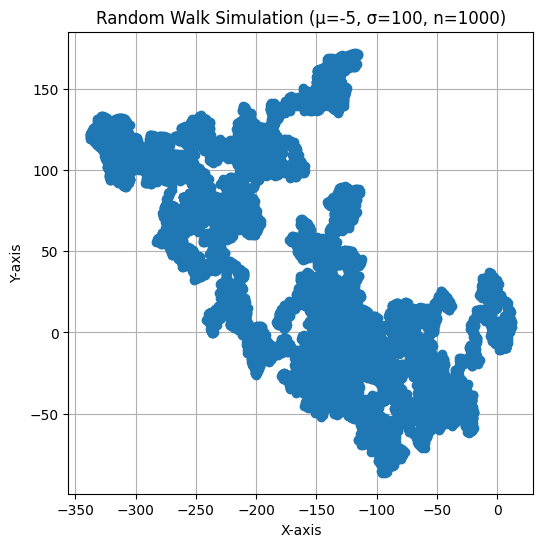

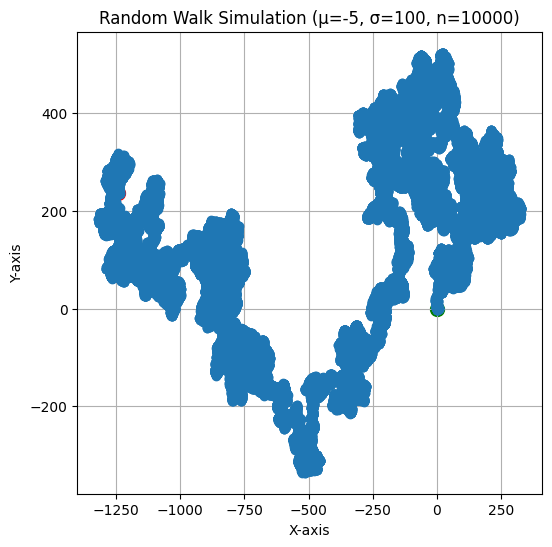

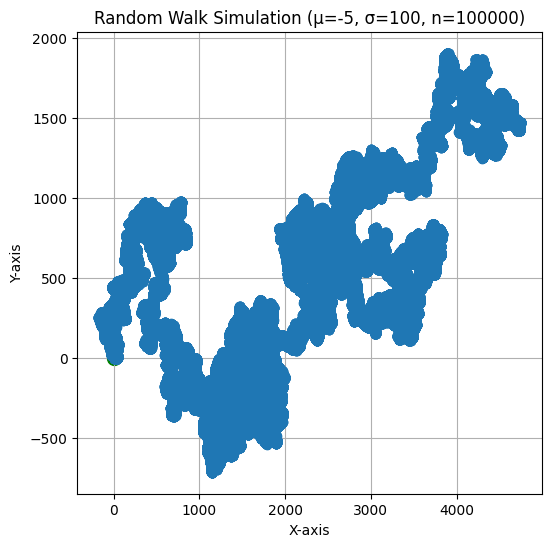

In [19]:
import numpy as np
import matplotlib.pyplot as plt

def simulate_movement(n, mu, sigma):
    positions = [np.array([0, 0])]
    for _ in range(n):
        num_steps = max(1, int(np.random.normal(mu, sigma)))
        move = np.random.normal(0, 1, (num_steps, 2))
        new_positions = positions[-1] + np.cumsum(move, axis=0)
        positions.extend(new_positions.tolist())
    return np.array(positions)

def draw_position_diagram(num_moves, mu, sigma):
    positions = simulate_movement(num_moves, mu, sigma)
    plt.figure(figsize=(6, 6))

    # Plot the path
    plt.plot(positions[:, 0], positions[:, 1], marker='o')

    # Mark the start and end points
    plt.scatter(positions[0, 0], positions[0, 1], c='green', marker='o', s=100)
    plt.scatter(positions[-1, 0], positions[-1, 1], c='red', marker='o', s=100)

    # Display the number of simulations in the plot title
    plt.title(f'Random Walk Simulation (μ={mu}, σ={sigma}, n={num_moves})')

    # Customize plot
    plt.grid(True)
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')
    plt.show()

mu_values = [1, -5]
sigma_values = [1, 2, 5, 10, 20, 25, 50, 100]

for mu in mu_values:
    for sigma in sigma_values:
        for n in [10, 100, 1000, 10000, 100000]:
            draw_position_diagram(n, mu, sigma)

## Q16

In [20]:
import numpy as np

def calculate_probability_return_origin(n, N):
    num_returned_to_origin = 0

    for _ in range(N):
        position = np.array([0, 0])

        for _ in range(n):
            move = np.random.choice(['left', 'right', 'up', 'down'], p=[0.25, 0.25, 0.25, 0.25])

            if move == 'left':
                position[0] -= 1
            elif move == 'right':
                position[0] += 1
            elif move == 'up':
                position[1] += 1
            elif move == 'down':
                position[1] -= 1

        if np.all(position == [0, 0]):
            num_returned_to_origin += 1

    probability_return_to_origin = num_returned_to_origin / N
    return probability_return_to_origin

n = 1000 # Number of steps in each random walk
N = 1000 # Numbeer of simulations

result = 1 - calculate_probability_return_origin(n, N)
print(f"Probability of returning to the origin: {result:.4f}")

Probability of returning to the origin: 1.0000


In [21]:
import numpy as np

def calculate_probability_return_to_origin_1(num_steps, num_simulations):
    num_returned_to_origin = 0

    possible_moves = [
        np.array([1, 1]),
        np.array([-1, 1]),
        np.array([1, -1]),
        np.array([-1, -1])
    ]

    for _ in range(num_simulations):
        position = np.array([0, 0])

        for _ in range(num_steps):
            move = possible_moves[np.random.choice(4, p=[0.25, 0.25, 0.25, 0.25])]
            position += move

        if np.all(position == [0, 0]):
            num_returned_to_origin += 1

    probability_return_to_origin = num_returned_to_origin / num_simulations
    return probability_return_to_origin

num_steps_per_walk = 1000  # Number of steps in each random walk
num_simulations = 1000     # Number of simulations

result = calculate_probability_return_to_origin_1(num_steps_per_walk, num_simulations)
print(f"Probability of returning to the origin: {result:.4f}")

Probability of returning to the origin: 0.0010


## Q 17

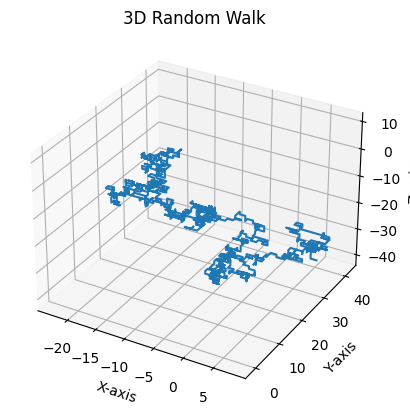

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Number of steps
num_steps = 1000

# Initial position at the origin
initial_position = np.array([0, 0, 0])

# List to store positions
positions = [initial_position]

# Define the directions and their probabilities
directions = [
    np.array([1, 0, 0]),   # Right
    np.array([-1, 0, 0]),  # Left
    np.array([0, 1, 0]),   # Up
    np.array([0, -1, 0]),  # Down
    np.array([0, 0, 1]),   # Forward
    np.array([0, 0, -1])   # Backward
]
direction_probs = [1/6, 1/6, 1/6, 1/6, 1/6, 1/6]

# Simulate the movement
for _ in range(num_steps):
    direction = np.random.choice(len(directions), p=direction_probs)
    new_position = positions[-1] + directions[direction]
    positions.append(new_position)

# Convert positions to a numpy array
positions = np.array(positions)

# Create a 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot3D(positions[:, 0], positions[:, 1], positions[:, 2], label='Changiz')

# Set labels and title
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')
ax.set_title('3D Random Walk')

# Show the plot
plt.show()

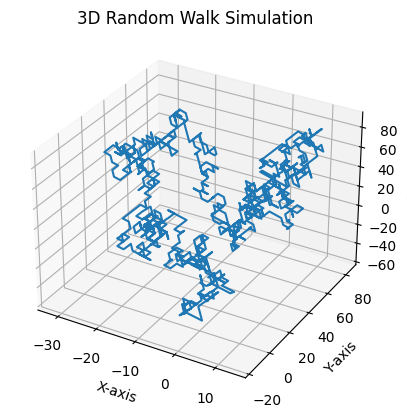

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Number of steps in the random walk
n_steps = 1000

# Initial position at the origin (0, 0, 0)
initial_position = np.array([0, 0, 0])

# List to store positions during the walk
positions = [initial_position]

# Define possible directions and their probabilities
directions = [
    np.array([1, 2, 4]),
    np.array([-1, 2, 4]),
    np.array([1, -2, 4]),
    np.array([-1, -2, 4]),
    np.array([1, 2, -4]),
    np.array([-1, 2, -4]),
    np.array([1, -2, -4]),
    np.array([-1, -2, -4])
]
direction_probs = [1/8, 1/8, 1/8, 1/8, 1/8, 1/8, 1/8, 1/8]

# Simulate the random walk
for _ in range(n_steps):
    direction = np.random.choice(len(directions), p=direction_probs)
    new_position = positions[-1] + directions[direction]
    positions.append(new_position)

# Convert positions to a numpy array
positions = np.array(positions)

# Create a 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot3D(positions[:, 0], positions[:, 1], positions[:, 2], label='Random Walk')

# Set labels and title for the plot
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')
ax.set_title('3D Random Walk Simulation')

# Show the plot
plt.show()

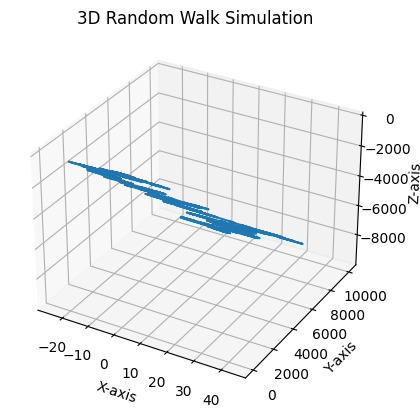

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Number of steps in the random walk
num_steps = 1000

# Initial position at the origin (0, 0, 0)
initial_position = np.array([0, 0, 0])

# List to store positions during the walk
positions = [initial_position]

# Define the parameters for random movement
mean_x = 0
scale_x = 2
shape_y = 5
scale_y = 2
loc_z = -10
scale_z = 3

# Simulate the random walk
for _ in range(num_steps):
    # Generate random values for each axis
    x_step = np.random.normal(mean_x, scale_x)
    y_step = np.random.gamma(shape_y, scale_y)
    z_step = np.random.laplace(loc_z, scale_z)

    new_position = positions[-1] + np.array([x_step, y_step, z_step])

    positions.append(new_position)

# Convert positions to a numpy array
positions = np.array(positions)

# Create a 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot3D(positions[:, 0], positions[:, 1], positions[:, 2], label='Random Walk')

# Set labels and title for the plot
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')
ax.set_title('3D Random Walk Simulation')

# Show the plot
plt.show()

## Q 18

The probability of getting back to origin is 0.2500


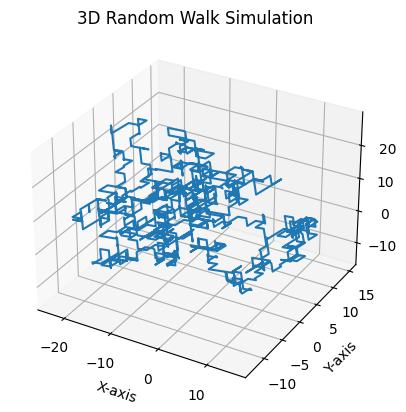

In [34]:
import numpy as np
import matplotlib.pyplot as plt

# Number of steps in the random walk
num_steps = 1000

# Initial position at the origin (0, 0, 0)
initial_position = np.array([0, 0, 0])

# List to store positions during the walk
positions = [initial_position]

# Define the parameters for random movement
probabilities = [1/8] * 8

directions_matrix = np.array([
    [1, 1, 1],
    [-1, 1, 1],
    [1, -1, 1],
    [-1, -1, 1],
    [1, 1, -1],
    [-1, 1, -1],
    [1, -1, -1],
    [-1, -1, -1]
])

# Simulate the random walk
for _ in range(num_steps):
    # Generate random direction based on probabilities
    direction = np.random.choice(len(probabilities), p=probabilities)

    new_position = positions[-1] + directions_matrix[direction]

    positions.append(new_position)

# Convert positions to a numpy array
positions = np.array(positions)


def random_walk_3D_back_to_origin(n, dxdydz):
    pos = np.array([0, 0, 0])

    for _ in range(n):
        step = dxdydz[np.random.choice(len(dxdydz), p=[1/len(dxdydz)] * len(dxdydz))]
        pos += step
        if np.all(pos == 0):
            return True
    return False

N = 1000
n = 100
dxdydz = np.array([
    [1, 1, 1],
    [1, 1, -1],
    [1, -1, 1],
    [-1, 1, 1],
    [1, -1, -1],
    [-1, -1, 1],
    [-1, 1, -1],
    [-1, -1, -1]
])
count = sum(random_walk_3D_back_to_origin(n, dxdydz) for _ in range(N))

probability_return_origin = count / N
print(f'The probability of getting back to origin is {probability_return_origin:.4f}')

# Create a 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot3D(positions[:, 0], positions[:, 1], positions[:, 2], label='Random Walk')

# Set labels and title for the plot
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')
ax.set_title('3D Random Walk Simulation')

# Show the plot
plt.show()



## Q 19
### As can be seen from the results of the probabilities in the two parts of question 16 and also question 18, it is clear that the probability of returning to the origin for question 18 is much lower than part 1 of question 16 because the degree of freedom of movement is much higher and in As a result, the probability of moving away from the origin increases. Also, compared to the second part, the probability that the distance from Genghis to the origin will increase in the total of 3 dimensions is less than this value in the two-dimensional mode. As a result, the probability of returning to the origin in 3D mode will be higher.

## Q 20

/usr/local/lib/python3.10/dist-packages/matplotlib/animation.py:884: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


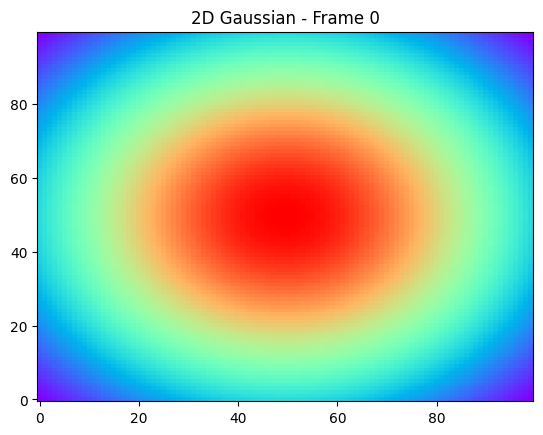

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

def generate_gaussian_frame(frame):
    mean_x, mean_y = 0, 0
    variance_x = 5 + 1.5 * np.cos(1 * frame)
    variance_y = 5 + 1.5 * np.cos(1 * frame)

    x = np.linspace(-3, 3, 100)
    y = np.linspace(-3, 3, 100)
    X, Y = np.meshgrid(x, y)

    Z = (
        np.exp(-(X - mean_x)**2 / (2 * variance_x))
        * np.exp(-(Y - mean_y)**2 / (2 * variance_y))
    )

    return Z

def update(frame):
    ax.clear()
    Z = generate_gaussian_frame(frame)

    ax.imshow(Z, cmap="rainbow", interpolation="nearest", origin="lower", aspect="auto")
    ax.set_title('2D Gaussian - Frame {}'.format(frame))

fig, ax = plt.subplots()

animation = FuncAnimation(fig, update, frames=100, interval=100, repeat=False)

from IPython.display import HTML
HTML(animation.to_jshtml())